In [ ]:
function ClickConnect(){
    console.log("런타임 끊김 방지"); 
    document.querySelector("colab-toolbar-button#connect").click() 
}
setInterval(ClickConnect, 60 * 1000)

In [1]:

from google.colab import drive
drive.mount('/content/drive')

folder = '/content/drive/MyDrive/Colab Notebooks/1s'


Mounted at /content/drive


In [2]:
# !pip install pandas
# !pip install numpy
# !pip install seaborn
# !pip install matplotlib
# !pip install xgboost
# !pip install lightgbm
# !pip install sklearn
# !pip install graphviz

# 라이브러리 임포트
import os
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import xgboost
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, RidgeCV, RidgeClassifier
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, GridSearchCV

import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, confusion_matrix

import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn

!pip install catboost
from catboost import CatBoostClassifier, Pool, CatBoostRegressor

     |████████████████████████████████| 76.1 MB 1.2 MB/s 


In [ ]:
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# EDA

## 변수 설명
  - **int_rate** : 대출자에 부여된 이자율 (Interest rate of the loan the applicant received)
  - **annual_inc** : 연 소득 (annual income)
  - **dti** : 소득 대비 부채 비율 (Debt-to-income ratio)
  - **delinq_2yrs** : 지난 2년 간 체납 발생 횟수 (Delinquencies on lines of credit in the last 2 years)
  - **inq_last_6mths** : 지난 6개월 간 신용 조회 수 (Inquiries into the applicant's credit during the last 6 months)
  - **pub_rec** : 파산 횟수 (Number of bankruptcies listed in the public record)
  - **revol_bal** : 리볼빙 잔액 (Total credit revolving balance)
  - **total_acc** : 지금까지 소유했던 신용카드 개수 (num_total_cc_accounts : Total number of credit card accounts in the applicant's history)
  - **collections_12_mths_ex_med** : 의료부문을 제외한 지난 12개월 간 추심 발생 횟수 (num_collections_last_12m : Number of collections in the last 12 months. This excludes medical collections)
  - **acc_now_delinq** : 대출자가 체납 상태에 있지 않은 계좌의 수 (The number of accounts on which the borrower is now delinquent)
  - **tot_coll_amt** : 대출자에 대한 현재까지의 총 추심액 (total_collection_amount_ever : The total amount that the applicant has had against them in collections)
  - **tot_cur_bal** : 전 계좌의 현재 통합 잔고 (Total current balance of all accounts)
  - **chargeoff_within_12_mths** : 대출 부 신청인의 대출 신청 직전 12개월 간 세금 공제 횟수 (Number of charge-offs within last 12 months at time of application for the secondary applicant)
  - **delinq_amnt** : 체납 금액 (delinquency amount)
  - **tax_liens** : 세금 저당권의 수 (Number of tax liens)
  - **emp_length1 ~ 12** : 고용 연수 (Number of years in the job)
  - **home_ownership1 ~ 6** : 대출 신청자의 주거 소유 형태 (The ownership status of the applicant's residence)
  - **verification_status1 ~ 3** : 공동 소득 발생 여부 및 형태 (verification_income_joint : Type of verification of the joint income)
  - **purpose1 ~ 14** : 대출 목적 (The purpose of the loan)
  - **initial_list_status1 ~ 2** : 최초 대출 상태 (Initial listing status of the loan)
  - **mths_since_last_delinq1 ~ 11** : 마지막 체납이 지금으로부터 몇개월 전에 있었는지를 나타내는 변수 (Months since the last delinquency)
  
  - **funded_amnt** : 대출액 (Funded amount)
  - **funded_amnt_inv** : 사채 대출액 (Funded amount by investors)
  - **total_rec_late_fee** : 총 연체료 중 납부액 (Late fees received to date)
  - **term1** : 상환 기간 (The number of payments on the loan. Values are in months and can be either 36 or 60)
  - **open_acc** : 개설 개좌 수 (The number of open credit lines in the borrower's credit file)
  - **installment** : 대출 발생 시 월 상환액 (The monthly payment owed by the borrower if the loan originates)
  - **revol_util** : 리볼빙 한도 대비 리볼빙 사용 비율 (Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit)
  - **out_prncp** : 대출액 중 원리금 잔액 (Remaining outstanding principal for total amount funded)
  - **out_prncp_inv** : 사채 대출액 중 원리금 잔액 (Remaining outstanding principal for total amount funded by investors)
  - **total_rec_int** : 이자 상환액 (Interest received to date)
  - **fico_range_low** : FICO(일종의 신용점수) 최저값 (The lower boundary range the borrower’s FICO at loan origination belongs to)
  - **fico_range_high** : FICO(일종의 신용점수) 최고값 (The upper boundary range the borrower’s FICO at loan origination belongs to)
  
  - **depvar** : 고객의 부도 여부 (dependent variable)

In [3]:
# df = pd.read_csv('/content/drive/MyDrive/train.csv')
df = pd.read_csv(os.path.join(folder, 'train.csv'))
df.head(20)

,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,initial_list_status1,initial_list_status2,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,funded_amnt,funded_amnt_inv,total_rec_late_fee,term1,open_acc,installment,revol_util,out_prncp,out_prncp_inv,total_rec_int,fico_range_low,fico_range_high,depvar
0,0.0824,21000.00,29.19,0,1,0,3016,26,0,0,0,11773,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1200,1200.0,0.0,1,18,37.74,0.076,0.0,0.0,157.94,765,769,0
1,0.1299,80000.00,4.82,0,1,1,5722,24,0,0,0,21875,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,8000,8000.0,0.0,1,8,269.52,0.447,0.0,0.0,1702.42,665,669,0
2,0.1299,38000.00,23.66,0,3,0,6511,18,0,0,0,31868,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,5000,5000.0,0.0,1,7,168.45,0.880,0.0,0.0,1066.64,670,674,0
3,0.1367,100000.00,16.27,4,2,0,6849,30,0,0,0,326049,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,15000,15000.0,0.0,1,12,510.27,0.457,0.0,0.0,1256.24,680,684,1
4,0.1269,30000.00,25.28,0,1,2,8197,12,0,0,2506,8840,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,10000,10000.0,0.0,1,8,335.45,0.416,0.0,0.0,871.04,660,664,1
5,0.1318,90000.00,3.48,7,0,0,2903,31,0,0,0,19548,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,7000,7000.0,0.0,1,7,236.47,0.854,0.0,0.0,1330.30,660,664,0
6,0.0791,60000.00,17.34,0,0,0,20399,35,0,0,0,117320,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,20000,20000.0,0.0,1,18,625.90,0.369,0.0,0.0,2567.44,750,754,0
7,0.0975,79600.00,15.97,3,0,1,6481,17,0,0,0,18757,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,23800,23800.0,0.0,1,7,765.17,0.745,0.0,0.0,3006.76,680,684,0
8,0.0789,150000.00,7.36,1,0,0,15827,38,0,0,543,367504,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,16000,16000.0,0.0,1,19,500.58,0.334,0.0,0.0,1286.38,665,669,0
9,0.0999,95000.00,25.78,0,1,0,17870,37,0,0,0,273776,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,8000,8000.0,0.0,1,24,258.10,0.764,0.0,0.0,796.59,665,669,0


# EDA

In [ ]:
df.info()

In [ ]:
df.describe()

,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,initial_list_status1,initial_list_status2,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,funded_amnt,funded_amnt_inv,total_rec_late_fee,term1,open_acc,installment,revol_util,out_prncp,out_prncp_inv,total_rec_int,fico_range_low,fico_range_high,depvar
count,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,0.130833,7.436061e+04,18.514508,0.343700,0.668880,0.235720,16090.202820,24.675910,0.018810,0.005800,250.588120,1.305281e+05,0.009630,19.288330,0.063820,0.065400,0.326240,0.089410,0.08058,0.059480,0.060710,0.046640,0.045320,0.045690,0.038570,0.075550,0.066410,0.000330,0.466120,0.000070,0.000050,0.110880,0.422550,0.321800,0.390200,0.288000,0.009620,0.226720,0.582810,0.0,0.060400,0.004250,0.019830,0.01101,0.007310,0.058200,0.000650,0.011250,0.007070,0.000880,0.434430,0.565570,0.489320,0.052360,0.060090,0.045700,0.050750,0.048560,0.051340,0.053430,0.048960,0.050030,0.049460,13735.317750,13729.341073,2.448885e+00,0.855920,11.620700,434.077648,0.537233,0.253327,0.253259,2491.282802,692.630550,696.630660,0.325690
std,0.044773,7.467409e+04,8.413049,0.905007,0.952044,0.661468,21569.939271,11.883834,0.150321,0.083585,2042.770881,1.503326e+05,0.110079,893.304366,0.468027,0.247232,0.468839,0.285336,0.27219,0.236522,0.238799,0.210868,0.208006,0.208813,0.192569,0.264278,0.248999,0.018163,0.498853,0.008366,0.007071,0.313985,0.493968,0.467169,0.487797,0.452833,0.097609,0.418712,0.493097,0.0,0.238228,0.065054,0.139417,0.10435,0.085186,0.234122,0.025487,0.105468,0.083786,0.029652,0.495684,0.495684,0.499888,0.222753,0.237655,0.208835,0.219488,0.214947,0.220691,0.224891,0.215786,0.218008,0.216828,8464.825314,8461.694483,1.489496e+01,0.351173,5.458774,265.921746,0.239373,18.053290,18.051746,2706.262200,29.668017,29.668584,0.468634
min,0.053200,5.360000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,

In [ ]:
# 결측치 확인
pd.DataFrame(df.isnull().sum()).rename(columns={0:'Non-Null Count'}).T

,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,initial_list_status1,initial_list_status2,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,funded_amnt,funded_amnt_inv,total_rec_late_fee,term1,open_acc,installment,revol_util,out_prncp,out_prncp_inv,total_rec_int,fico_range_low,fico_range_high,depvar
Non-Null Count,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# 라벨(depvar) 비율 확인
print('y=1 ratio :', df.depvar.sum()/len(df))

y=1 ratio : 0.32569


#데이터 시각화

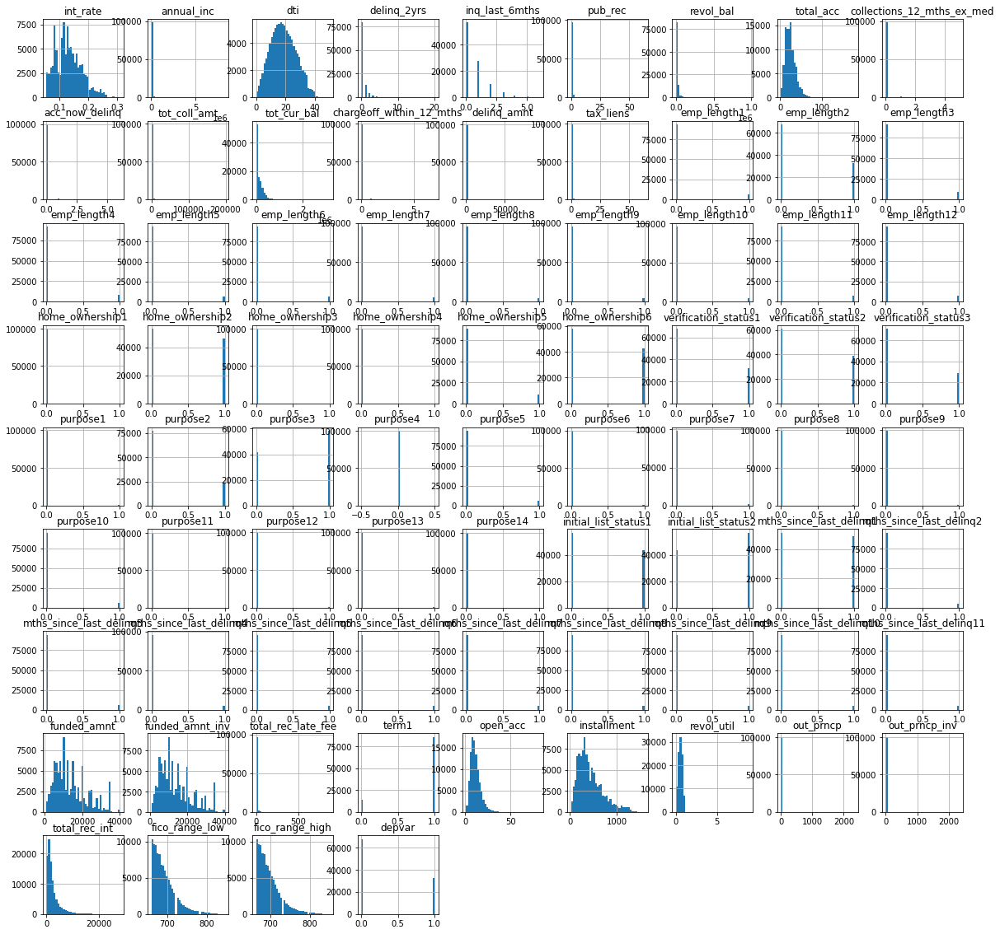

In [ ]:
df.hist(bins=40 , figsize=(20,20)) #Pandas Hist function
plt.show()

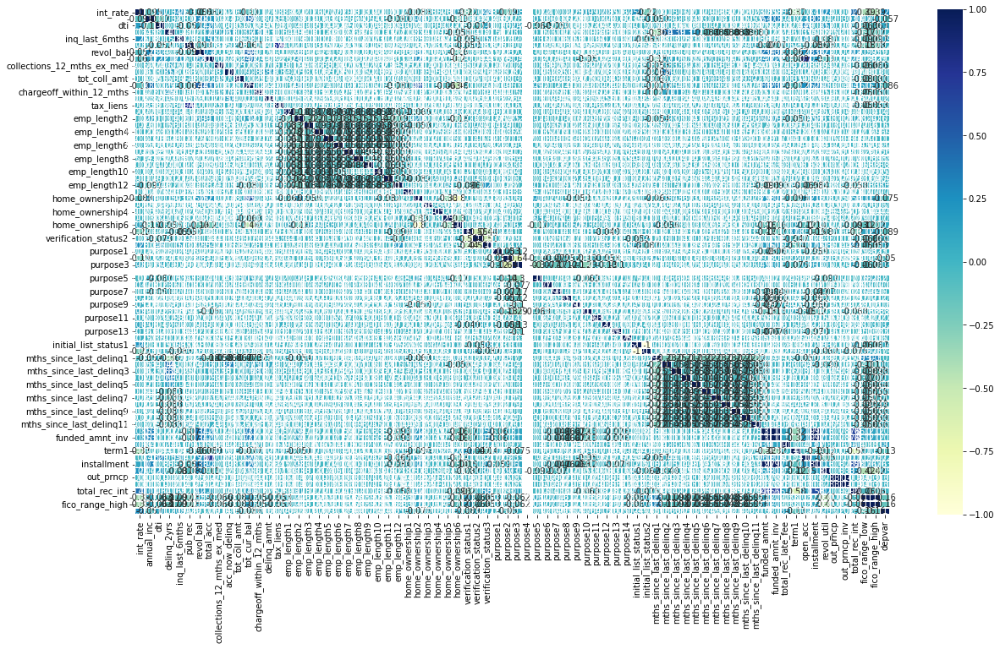

In [ ]:
corr = df.corr()
plt.figure(figsize=(20,11))
ax = sns.heatmap(corr,cmap="YlGnBu", linewidths=.5, annot=True )
plt.yticks(rotation=0)
plt.show()

In [ ]:
import seaborn as sns
df_see = df.drop()
sns.set(style="white")

g = sns.PairGrid(df, diag_sharey=False)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3)

g.map_upper(sns.regplot)

display(g.fig)

KeyboardInterrupt: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7f2028683050> (for post_execute):


KeyboardInterrupt: ignored

# Train Valid Split

In [4]:
X = df.drop('depvar', axis=1)
y = df['depvar']

In [5]:
# data를 training set과 validation set으로 나누기
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2)
# X_test, X_valid, y_test, y_valid = train_test_split(X_valid, y_valid, test_size=0.5)


In [6]:
# training set과 validation set의 데이터 수 확인
print('training set length :', len(X_train))
print('validation set length :', len(X_valid))
# print('test set length :', len(X_test))

training set length : 80000
validation set length : 20000


In [7]:
# validation set의 라벨 비율 확인
print(y_valid.sum()/len(y_valid))
# print(y_test.sum()/len(y_test))


0.32455


In [8]:
# 평가 함수 정의
def get_clf_eval(y_actual, y_pred):
    accuracy = accuracy_score(y_actual, y_pred)
    precision = precision_score(y_actual, y_pred)
    recall = recall_score(y_actual, y_pred)
    AUC = roc_auc_score(y_actual, y_pred)
    F1 = f1_score(y_actual, y_pred)
    print('\n정확도accuracy: {:.4f}'.format(accuracy))
    print('정밀도precision: {:.4f}'.format(precision))
    print('재현율recall: {:.4f}'.format(recall))
    print('AUC: {:.4f}'.format(AUC))
    print('F1: {:.4f}'.format(F1))
    sns.heatmap(confusion_matrix(y_actual, y_pred), annot=True, fmt='d', cmap='YlGnBu')
    return {'정확도accuracy' : accuracy, '정밀도precision': precision, '재현율recall': recall, 'AUC': AUC, 'F1': F1}

# Single Model(XGBoost)
## XGBClassifier의 하이퍼 파라미터 설명
- **LINK** : https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier
- **max_depth=3** : 디시전 트리의 최대 깊이
- **learning_rate=0.1** : 0과 1 사이의 값을 가지는 부스팅에 대한 학습률(eta). 매 부스팅 단계 이후 새로이 추가된 가중치는 이 파라미터로 조정된다. 이 값이 낮을수록 보수적이며, 수렴에 필요한 더 많은 디시전 트리가 필요하다.
- **n_estimators=100** : 라운드의 횟수 또는 부스팅된 디시전 트리의 개수
- **silent=True** : 부스팅의 수행 동안 메시지를 출력할지에 대한 여부
- **objective="reg:linear"** : 모델이 학습할 작업의 분류, 미리 정의된 작업은 문자열로 지정이 가능하지만, 그렇지 않은 경우 콜러블callable을 만들어서 지정할 수도 있다.
- **booster="gbtree"** : 'gbtree', 'gblinear', 'dart'일 수 있다. 'dart'는 드롭아웃(dropout)이라는 특성을 추가한다(과적합 방지를 위해 무작위로 디시전 트리를 선택해 제거(드롭)한다). 'gblinear'는 정규화된 선형 모델을 만든다(디시전 트리가 아니라 라소 회귀와 유사하다).
- **nthread=None** : 더 이상 사용되지 않는다.
- **n_jobs** : 사용할 스레드의 개수
- **gamma=0** : 노드 분할에 필요한 최소 손실 감소
- **min_child_weight=1** : 자식 노드 생성에 필요한 헤시안(hessian) 합의 최솟값
- **max_delta_step=0** : 보다 보수적으로 갱신을 수행하도록 만드는 값. 불균형 범주의 데이터셋에 대해서는 1부터 10까지의 값으로 설정한다.
- **subsample=1** : 부스팅에 사용할 샘플의 비율
- **colsample_bytree=1** : 부스팅에 사용할 특징 열의 비율
- **colsample_bylevel=1** : 각 디시전 트리의 수준별 사용할 특징 열의 비율
- **colsample_bynode=1** : 각 디시전 트리의 노드별 사용할 특징 열의 비율
- **reg_alpha=0** : L1 정규화(가중치의 평균). 이 값이 클수록 보수적이게 된다.
- **reg_lambda=1** : L2 정규화(가중치의 제곱근). 이 값이 클수록 보수적이게 된다.
- **base_score=.5** : 초기 편향치(bias)
- **seed=None** : 더 이상 사용되지 않는다.
- **random_state=0** : 난수 생성 시드
- **missing=None** : 누락된 데이터가 해석될 값. None은 np.nan을 의미한다.
- **importance_type='gain'** : 특징 중요도의 유형. 'gain', 'weight', 'cover', 'total_gain', 'total_cover'로 설정될 수 있다.

In [15]:
# 하이퍼 파라미터 튜닝
xgb_clf = xgboost.XGBClassifier()

param_grid = {'max_depth':[3,5,7,9],
              'n_estimators': [50,100,200,300]}

cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

grid_search1 = GridSearchCV(estimator=xgb_clf,
                           param_grid=param_grid, 
                           n_jobs=-1,
                           cv=cv,
                           scoring='f1_macro', 
                           error_score=0) 

results=grid_search1.fit(X_train, y_train)

results.best_params_

{'max_depth': 7, 'n_estimators': 300}

In [ ]:
grid_search1.cv_results_

In [16]:
# 하이퍼 파라미터 튜닝
xgb_clf = xgboost.XGBClassifier()

param_grid = {'max_depth':[5,7,9],
              'n_estimators': [300, 400, 500]}

cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

grid_search = GridSearchCV(estimator=xgb_clf,
                           param_grid=param_grid, 
                           n_jobs=-1,
                           cv=cv,
                           scoring='f1_macro', 
                           error_score=0) 

results=grid_search.fit(X_train, y_train)

results.best_params_

{'max_depth': 9, 'n_estimators': 300}

In [17]:
grid_search.cv_results_

{'mean_fit_time': array([112.25395482, 154.72299783, 181.24628725, 154.71278224,
        203.98530929, 254.45454779, 203.61719534, 270.27532778,
        334.4272898 ]),
 'mean_score_time': array([0.5475594 , 0.70546207, 0.77320211, 0.68609247, 0.90541229,
        1.11725256, 0.95832927, 1.28087277, 1.60228264]),
 'mean_test_score': array([0.6948837 , 0.69724698, 0.69784593, 0.6987169 , 0.69850371,
        0.69869644, 0.69923729, 0.69849141, 0.69754425]),
 'param_max_depth': masked_array(data=[5, 5, 5, 7, 7, 7, 9, 9, 9],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[300, 400, 500, 300, 400, 500, 300, 400, 500],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'params': [{'max_depth': 5, 'n_estimators': 300},
  {'max_depth': 5, 'n_e

In [11]:
# 하이퍼 파라미터 튜닝
xgb_clf = xgboost.XGBClassifier()

param_grid = {'max_depth':[5,7,9],
              'n_estimators': [50,100,200,300]}

cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

grid_search3 = GridSearchCV(estimator=xgb_clf,
                           param_grid=param_grid, 
                           n_jobs=-1,
                           cv=cv,
                           scoring='f1_macro', 
                           error_score=0) 

results=grid_search3.fit(X_train, y_train)

results.best_params_

{'max_depth': 7, 'n_estimators': 300}

In [12]:
grid_search3.cv_results_

{'mean_fit_time': array([ 17.33911817,  33.51887197,  66.47513332,  98.86660063,
         25.02109251,  52.20747218, 108.35579517, 158.73510056,
         35.0729996 ,  61.07400177, 108.84061799, 172.77174196]),
 'mean_score_time': array([0.10599854, 0.1642478 , 0.27612681, 0.37483814, 0.12394421,
        0.23561823, 0.42670789, 0.59769387, 0.16201236, 0.24542656,
        0.41838214, 0.67794271]),
 'mean_test_score': array([0.65818675, 0.67920939, 0.69115744, 0.69469898, 0.67949298,
        0.69193924, 0.69689375, 0.69833561, 0.68973551, 0.69648186,
        0.69746447, 0.69756673]),
 'param_max_depth': masked_array(data=[5, 5, 5, 5, 7, 7, 7, 7, 9, 9, 9, 9],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[50, 100, 200, 300, 50, 100, 200, 300, 50, 100, 200,
                    300],
              mask=[False, False, Fals

In [15]:
# 하이퍼 파라미터 튜닝
xgb_clf = xgboost.XGBClassifier()

param_grid = {'max_depth':[9],
              'n_estimators': list(range(200,320,20))}

cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

grid_search0 = GridSearchCV(estimator=xgb_clf,
                           param_grid=param_grid, 
                           n_jobs=-1,
                           cv=cv,
                           scoring='f1_macro', 
                           error_score=0) 

results=grid_search0.fit(X_train, y_train)

results.best_params_

{'max_depth': 9, 'n_estimators': 260}

In [16]:
grid_search0.cv_results_

{'mean_fit_time': array([123.20882573, 135.35691504, 145.73361392, 158.36448724,
        168.7910392 , 180.71989341]),
 'mean_score_time': array([0.48102498, 0.53951552, 0.57178857, 0.60704367, 0.65803354,
        0.68829784]),
 'mean_test_score': array([0.697719  , 0.69735937, 0.69793846, 0.69798098, 0.69793377,
        0.69796581]),
 'param_max_depth': masked_array(data=[9, 9, 9, 9, 9, 9],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[200, 220, 240, 260, 280, 300],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'max_depth': 9, 'n_estimators': 200},
  {'max_depth': 9, 'n_estimators': 220},
  {'max_depth': 9, 'n_estimators': 240},
  {'max_depth': 9, 'n_estimators': 260},
  {'max_depth': 9, 'n_estimators': 280},
  {'max_depth': 9, 'n_estimators': 300}],
 'rank_test_score': array([5, 6, 3, 1, 4, 2],

In [ ]:
# 하이퍼 파라미터 튜닝
xgb_clf = xgboost.XGBClassifier()

param_grid = {'max_depth':[3,5,7,9],
              'n_estimators': [100,200,300]}

cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=2)

grid_search4 = GridSearchCV(estimator=xgb_clf,
                           param_grid=param_grid, 
                           n_jobs=-1,
                           cv=cv,
                           scoring='accuracy', 
                           error_score=0) 

results=grid_search4.fit(X_train, y_train)

results.best_params_

In [ ]:
grid_search4.cv_results_

In [ ]:
# best parameter를 사용하여 prediction 수행
xgb_clf = xgboost.XGBClassifier(max_depth = results.best_params_['max_depth'],
                                n_estimators = results.best_params_['n_estimators'],
                                eval_metric='mlogloss')

In [ ]:
xgb_clf = xgboost.XGBClassifier(max_depth = 5,
                                n_estimators = 299,
                                eval_metric='mlogloss')

In [ ]:


xgb_clf.fit(X_train, y_train)

y_pred_xgb = xgb_clf.predict(X_valid)

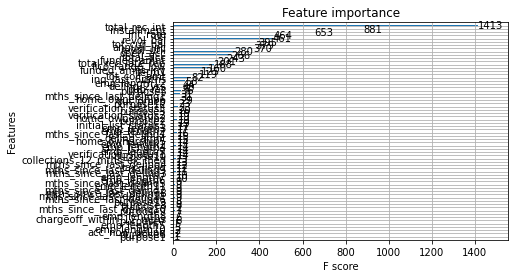

In [ ]:
import xgboost as xgb

xgb.plot_importance(xgb_clf)

In [ ]:
# y_valid가 0 또는 1일 확률 출력
y_pred_prob = xgb_clf.predict_proba(X_valid)

print(len(y_pred_prob))
y_pred_prob

20000


array([[0.8749127 , 0.12508734],
       [0.22817653, 0.77182347],
       [0.7755881 , 0.22441189],
       ...,
       [0.6803547 , 0.31964526],
       [0.9558677 , 0.04413228],
       [0.8032835 , 0.19671647]], dtype=float32)

In [ ]:
# y_valid가 1일 확률 출력
y_pred_prob[:,1]

array([0.05295987, 0.1549587 , 0.05818719, ..., 0.49324298, 0.6826446 ,
       0.27548695], dtype=float32)

In [ ]:
# y_valid 예측값 출력
# y_pred_prob[:,1]이 0.5(threshold)보다 큰 경우 1의 예측값을 return한다

print(len(y_pred_xgb))
y_pred_xgb

20000


array([0, 0, 0, ..., 0, 1, 0])

In [ ]:
# 1로 예측된 y_valid 갯수 및 비율 출력
print(y_pred_xgb.sum())
print(y_pred_xgb.sum()/len(y_pred_xgb))

3391
0.16955



정확도accuracy: 0.7557
정밀도precision: 0.6721
재현율recall: 0.4713
AUC: 0.6810
F1: 0.5540


{'AUC': 0.68102750141996,
 'F1': 0.5540343190945601,
 '재현율recall': 0.47127329192546585,
 '정밀도precision': 0.6720549158547388,
 '정확도accuracy': 0.7557}

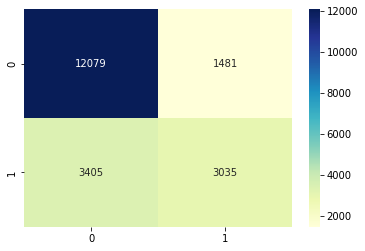

In [ ]:
# xgboost 성능 확인
get_clf_eval(y_valid, y_pred_xgb)

In [ ]:
y_pred_prob[:,1]>0.4

array([False, False, False, ..., False, False, False])

In [ ]:
y_valid

63280    0
65614    0
96557    0
66940    1
95921    0
        ..
36881    1
36719    0
6142     1
37533    0
98563    0
Name: depvar, Length: 20000, dtype: int64


정확도accuracy: 0.7500
정밀도precision: 0.6134
재현율recall: 0.6050
AUC: 0.7119
F1: 0.6091


{'AUC': 0.7119240000732883,
 'F1': 0.6091307066916822,
 '재현율recall': 0.6049689440993788,
 '정밀도precision': 0.6133501259445844,
 '정확도accuracy': 0.75}

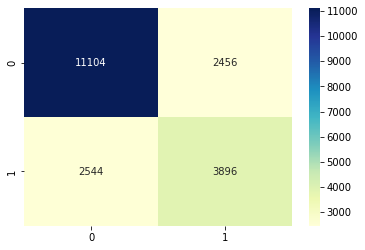

In [ ]:
# threshold 변경 및 성능 확인
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)

In [ ]:
!pip install scikit-optimize

     |████████████████████████████████| 100 kB 4.1 MB/s 


In [ ]:
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold, KFold
# Classifier
ITERATIONS = 10 # 1000
TRAINING_SIZE = 100000 # 20000000
TEST_SIZE = 25000

bayes_cv_tuner = BayesSearchCV(
    estimator = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        eval_metric = 'auc',
        silent=1,
        tree_method='approx'
    ),
    search_spaces = {
        'learning_rate': (0.01, 1.0, 'log-uniform'),
        'min_child_weight': (0, 10),
        'max_depth': (0, 10),
        'max_delta_step': (0, 20),
        'subsample': (0.01, 1.0, 'uniform'),
        'colsample_bytree': (0.01, 1.0, 'uniform'),
        'colsample_bylevel': (0.01, 1.0, 'uniform'),
        'reg_lambda': (1e-9, 1000, 'log-uniform'),
        'reg_alpha': (1e-9, 1.0, 'log-uniform'),
        'gamma': (1e-9, 0.5, 'log-uniform'),
        'min_child_weight': (0, 5),
        'n_estimators': (50, 100),
        'scale_pos_weight': (1e-6, 500, 'log-uniform')
    },    
    scoring = 'roc_auc',
    cv = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=42
    ),
    n_jobs = 3,
    n_iter = ITERATIONS,   
    verbose = 0,
    refit = True,
    random_state = 42
)

def status_print(optim_result):
    """Status callback durring bayesian hyperparameter search"""
    
    # Get all the models tested so far in DataFrame format
    all_models = pd.DataFrame(bayes_cv_tuner.cv_results_)    
    
    # Get current parameters and the best parameters    
    best_params = pd.Series(bayes_cv_tuner.best_params_)
    print('Model #{}\nBest ROC-AUC: {}\nBest params: {}\n'.format(
        len(all_models),
        np.round(bayes_cv_tuner.best_score_, 4),
        bayes_cv_tuner.best_params_
    ))
    
    # Save all model results
    clf_name = bayes_cv_tuner.estimator.__class__.__name__
    all_models.to_csv(clf_name+"_cv_results.csv")

In [ ]:
xgb_result = bayes_cv_tuner.fit(X_train.values, y_train.values, callback=status_print)

ValueError: ignored

In [ ]:
!pip install catboost

     |████████████████████████████████| 76.1 MB 1.1 MB/s 


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Gradient Boosting
import lightgbm as lgb
import xgboost as xgb

# Scikit-learn
from sklearn.metrics import average_precision_score
from sklearn.model_selection import StratifiedKFold ,RepeatedStratifiedKFold
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Graphics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
# Importing core libraries
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Our example dataset
from sklearn.datasets import load_boston

# Classifiers
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostClassifier

# Hyperparameters distributions
from scipy.stats import randint
from scipy.stats import uniform

# Model selection
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import cross_val_score

# Metrics
from sklearn.metrics import average_precision_score
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt import gp_minimize # Bayesian optimization using Gaussian Processes
from skopt.space import Real, Categorical, Integer
from skopt.utils import use_named_args # decorator to convert a list of parameters to named arguments
from skopt.callbacks import DeadlineStopper # Stop the optimization before running out of a fixed budget of time.
from skopt.callbacks import VerboseCallback # Callback to control the verbosity
from skopt.callbacks import DeltaXStopper # Stop the optimization If the last two positions at which the objective has been evaluated are less than delta

In [ ]:
# Setting a 5-fold stratified cross-validation (note: shuffle=True)
skf = RepeatedStratifiedKFold(n_splits=5, n_repeats=2,  random_state=8)
# Converting average precision score into a scorer suitable for model selection
avg_prec = make_scorer(average_precision_score, greater_is_better=True, needs_proba=True)

In [ ]:
clf = xgb.XGBClassifier(
        n_jobs = 1,
        objective = 'binary:logistic',
        silent=1,
        tree_method='approx')

In [ ]:
search_spaces = {'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                 'min_child_weight': Integer(0, 10),
                 'max_depth': Integer(0, 50),
                 'max_delta_step': Integer(0, 20), # Maximum delta step we allow each leaf output
                 'subsample': Real(0.01, 1.0, 'uniform'),
                 'colsample_bytree': Real(0.01, 1.0, 'uniform'), # subsample ratio of columns by tree
                 'colsample_bylevel': Real(0.01, 1.0, 'uniform'), # subsample ratio by level in trees
                 'reg_lambda': Real(1e-9, 1000, 'log-uniform'), # L2 regularization
                 'reg_alpha': Real(1e-9, 1.0, 'log-uniform'), # L1 regularization
                 'gamma': Real(1e-9, 0.5, 'log-uniform'), # Minimum loss reduction for partition
                 'n_estimators': Integer(50, 100),
                 'scale_pos_weight': Real(1e-6, 500, 'log-uniform')}

In [ ]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title, callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    if callbacks:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
    best_score = optimizer.best_score_
    best_score_std = optimizer.cv_results_['std_test_score'][optimizer.best_index_]
    best_params = optimizer.best_params_
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           +u"\u00B1"+" %.3f") % (time() - start, 
                                  len(optimizer.cv_results_['params']),
                                  best_score,
                                  best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()
    return best_params

In [ ]:
opt = BayesSearchCV(clf,
                    search_spaces,
                    scoring=avg_prec,
                    cv=skf,
                    n_iter=40,
                    n_jobs=-1,
                    return_train_score=False,
                    refit=True,
                    optimizer_kwargs={'base_estimator': 'GP'},
                    random_state=22)
    
best_params = report_perf(opt, X_train, y_train,'XGBoost',                           
                          callbacks=[DeltaXStopper(0.001), 
                                     DeadlineStopper(60*5)])

XGBoost took 387.76 seconds,  candidates checked: 1, best CV score: 0.640 ± 0.007
Best parameters:
OrderedDict([('colsample_bylevel', 0.3706219857878677),
             ('colsample_bytree', 0.6142670193823258),
             ('gamma', 0.1331227203252178),
             ('learning_rate', 0.03450570695385555),
             ('max_delta_step', 2),
             ('max_depth', 18),
             ('min_child_weight', 8),
             ('n_estimators', 52),
             ('reg_alpha', 1.081049236893711e-05),
             ('reg_lambda', 1.043686239159047),
             ('scale_pos_weight', 0.19222548462579486),
             ('subsample', 0.6941640075502717)])



#cockpit   
https://cockpit.readthedocs.io/en/latest/examples/01_basic_fmnist.html

In [ ]:
# !pip install cockpit-for-pytorch


In [ ]:
# from cockpit import Cockpit, CockpitPlotter
# from cockpit.utils.configuration import configuration


# # Create Cockpit and a plotter
# cockpit = Cockpit(model.parameters(), quantities=configuration("full"))
# plotter = CockpitPlotter()

# TabNet    
https://wsshin.tistory.com/5   
https://dreamquark-ai.github.io/tabnet/generated_docs/README.html#tabnet-attentive-interpretable-tabular-learning   
https://github.com/dreamquark-ai/tabnet

In [ ]:
!pip install pytorch-tabnet

In [ ]:
import os
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import LabelEncoder
from matplotlib import pyplot as plt

import torch
import torch.nn as nn
from pytorch_tabnet.tab_model import TabNetClassifier, TabNetRegressor


In [ ]:
y_train

43311    1
83224    0
90751    0
9219     0
9755     1
        ..
70420    0
84334    1
58663    0
86265    1
54083    0
Name: depvar, Length: 80000, dtype: int64

In [ ]:
X_train

,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,chargeoff_within_12_mths,delinq_amnt,tax_liens,emp_length1,emp_length2,emp_length3,emp_length4,emp_length5,emp_length6,emp_length7,emp_length8,emp_length9,emp_length10,emp_length11,emp_length12,home_ownership1,home_ownership2,home_ownership3,home_ownership4,home_ownership5,home_ownership6,verification_status1,verification_status2,verification_status3,purpose1,purpose2,purpose3,purpose4,purpose5,purpose6,purpose7,purpose8,purpose9,purpose10,purpose11,purpose12,purpose13,purpose14,initial_list_status1,initial_list_status2,mths_since_last_delinq1,mths_since_last_delinq2,mths_since_last_delinq3,mths_since_last_delinq4,mths_since_last_delinq5,mths_since_last_delinq6,mths_since_last_delinq7,mths_since_last_delinq8,mths_since_last_delinq9,mths_since_last_delinq10,mths_since_last_delinq11,funded_amnt,funded_amnt_inv,total_rec_late_fee,term1,open_acc,installment,revol_util,out_prncp,out_prncp_inv,total_rec_int,fico_range_low,fico_range_high
43311,0.2499,83688.0,4.45,0,3,0,7862,25,0,0,0,18566,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,11925,11925.0,0.0,0,13,349.95,0.936,0.0,0.0,3234.06,670,674
83224,0.1999,101800.0,9.60,1,1,2,3914,20,0,0,0,32618,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,12150,12150.0,0.0,0,13,321.84,0.311,0.0,0.0,6724.50,715,719
90751,0.1757,94000.0,6.24,0,1,0,18628,16,0,0,0,273161,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,25000,25000.0,0.0,1,6,898.43,0.763,0.0,0.0,7294.50,675,679
9219,0.1580,108000.0,29.26,3,0,0,36091,42,0,0,0,265688,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,18000,18000.0,0.0,0,12,435.82,0.940,0.0,0.0,2043.70,685,689
9755,0.2290,80000.0,21.04,0,0,0,58520,33,0,0,0,335362,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,35000,35000.0,0.0,0,22,984.66,0.740,0.0,0.0,6392.85,665,669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70420,0.1144,45000.0,4.65,0,0,0,4903,19,0,0,0,4903,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,6000,6000.0,0.0,1,3,197.69,0.584,0.0,0.0,512.63,705,709
84334,0.1399,33000.0,27.20,0,0,0,3777,12,0,0,0,23789,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,11075,11075.0,0.0,1,12,378.47,0.250,0.0,0.0,1341.26,715,719
58663,0.0890,128000.0,16.63,1,1,0,40371,48,0,0,0,267721,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,14000,13975.0,0.0,1,18,444.55,0.697,0.0,0.0,401.76,705,709
86265,0.1777,104000.0,13.44,0,1,0,9233,12,0,0,0,38738,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,10000,10000.0,0.0,1,10,360.38,0.933,0.0,0.0,1333.06,660,664


In [ ]:
from sklearn.preprocessing import LabelEncoder

nunique = X_train.nunique()
categorical_columns = []
categorical_dims =  {}
categorical_dims_all = {}
for col in X_train.columns:
    l_enc = LabelEncoder()
    X_train[col] = l_enc.fit_transform(X_train[col].values)        
    categorical_columns.append(col)
    categorical_dims_all[col] = len(l_enc.classes_)
categorical_columns = []
for col in X_train.columns:
    if nunique[col] < 20:
        categorical_columns.append(col)
        categorical_dims[col] = len(l_enc.classes_)

In [ ]:
print(X_train.columns)
print(len(X_train.columns))

Index(['int_rate', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths',
       'pub_rec', 'revol_bal', 'total_acc', 'collections_12_mths_ex_med',
       'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal',
       'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens', 'emp_length1',
       'emp_length2', 'emp_length3', 'emp_length4', 'emp_length5',
       'emp_length6', 'emp_length7', 'emp_length8', 'emp_length9',
       'emp_length10', 'emp_length11', 'emp_length12', 'home_ownership1',
       'home_ownership2', 'home_ownership3', 'home_ownership4',
       'home_ownership5', 'home_ownership6', 'verification_status1',
       'verification_status2', 'verification_status3', 'purpose1', 'purpose2',
       'purpose3', 'purpose4', 'purpose5', 'purpose6', 'purpose7', 'purpose8',
       'purpose9', 'purpose10', 'purpose11', 'purpose12', 'purpose13',
       'purpose14', 'initial_list_status1', 'initial_list_status2',
       'mths_since_last_delinq1', 'mths_since_last_delinq2',
       'mths_since_l

In [ ]:
print(categorical_dims_all)
print(len(categorical_dims_all))

{'int_rate': 256, 'annual_inc': 7495, 'dti': 4113, 'delinq_2yrs': 19, 'inq_last_6mths': 7, 'pub_rec': 22, 'revol_bal': 32777, 'total_acc': 103, 'collections_12_mths_ex_med': 6, 'acc_now_delinq': 6, 'tot_coll_amt': 3414, 'tot_cur_bal': 67033, 'chargeoff_within_12_mths': 7, 'delinq_amnt': 271, 'tax_liens': 21, 'emp_length1': 2, 'emp_length2': 2, 'emp_length3': 2, 'emp_length4': 2, 'emp_length5': 2, 'emp_length6': 2, 'emp_length7': 2, 'emp_length8': 2, 'emp_length9': 2, 'emp_length10': 2, 'emp_length11': 2, 'emp_length12': 2, 'home_ownership1': 2, 'home_ownership2': 2, 'home_ownership3': 2, 'home_ownership4': 2, 'home_ownership5': 2, 'home_ownership6': 2, 'verification_status1': 2, 'verification_status2': 2, 'verification_status3': 2, 'purpose1': 2, 'purpose2': 2, 'purpose3': 2, 'purpose4': 1, 'purpose5': 2, 'purpose6': 2, 'purpose7': 2, 'purpose8': 2, 'purpose9': 2, 'purpose10': 2, 'purpose11': 2, 'purpose12': 2, 'purpose13': 2, 'purpose14': 2, 'initial_list_status1': 2, 'initial_list_st

In [ ]:
print(categorical_columns)
print(len(categorical_columns))

['delinq_2yrs', 'inq_last_6mths', 'collections_12_mths_ex_med', 'acc_now_delinq', 'chargeoff_within_12_mths', 'emp_length1', 'emp_length2', 'emp_length3', 'emp_length4', 'emp_length5', 'emp_length6', 'emp_length7', 'emp_length8', 'emp_length9', 'emp_length10', 'emp_length11', 'emp_length12', 'home_ownership1', 'home_ownership2', 'home_ownership3', 'home_ownership4', 'home_ownership5', 'home_ownership6', 'verification_status1', 'verification_status2', 'verification_status3', 'purpose1', 'purpose2', 'purpose3', 'purpose4', 'purpose5', 'purpose6', 'purpose7', 'purpose8', 'purpose9', 'purpose10', 'purpose11', 'purpose12', 'purpose13', 'purpose14', 'initial_list_status1', 'initial_list_status2', 'mths_since_last_delinq1', 'mths_since_last_delinq2', 'mths_since_last_delinq3', 'mths_since_last_delinq4', 'mths_since_last_delinq5', 'mths_since_last_delinq6', 'mths_since_last_delinq7', 'mths_since_last_delinq8', 'mths_since_last_delinq9', 'mths_since_last_delinq10', 'mths_since_last_delinq11', '

In [ ]:
print(categorical_dims)
print(len(categorical_dims))

{'delinq_2yrs': 38, 'inq_last_6mths': 38, 'collections_12_mths_ex_med': 38, 'acc_now_delinq': 38, 'chargeoff_within_12_mths': 38, 'emp_length1': 38, 'emp_length2': 38, 'emp_length3': 38, 'emp_length4': 38, 'emp_length5': 38, 'emp_length6': 38, 'emp_length7': 38, 'emp_length8': 38, 'emp_length9': 38, 'emp_length10': 38, 'emp_length11': 38, 'emp_length12': 38, 'home_ownership1': 38, 'home_ownership2': 38, 'home_ownership3': 38, 'home_ownership4': 38, 'home_ownership5': 38, 'home_ownership6': 38, 'verification_status1': 38, 'verification_status2': 38, 'verification_status3': 38, 'purpose1': 38, 'purpose2': 38, 'purpose3': 38, 'purpose4': 38, 'purpose5': 38, 'purpose6': 38, 'purpose7': 38, 'purpose8': 38, 'purpose9': 38, 'purpose10': 38, 'purpose11': 38, 'purpose12': 38, 'purpose13': 38, 'purpose14': 38, 'initial_list_status1': 38, 'initial_list_status2': 38, 'mths_since_last_delinq1': 38, 'mths_since_last_delinq2': 38, 'mths_since_last_delinq3': 38, 'mths_since_last_delinq4': 38, 'mths_si

In [ ]:
features = [ col for col in X_train.columns ]
cat_idxs = [ i for i, f in enumerate(features) if f in categorical_columns]
cat_dims = [ categorical_dims[f] for i, f in enumerate(features) if f in categorical_columns]

In [ ]:
cat_idxs

In [ ]:
cat_dims

In [ ]:
clf

TabNetClassifier(n_d=8, n_a=8, n_steps=3, gamma=1.3, cat_idxs=[15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 66], cat_dims=[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], cat_emb_dim=10, n_independent=2, n_shared=2, epsilon=1e-15, momentum=0.02, lambda_sparse=0.001, seed=0, clip_value=1, verbose=1, optimizer_fn=<class 'torch.optim.adam.Adam'>, optimizer_params={'lr': 0.01}, scheduler_fn=<class 'torch.optim.lr_scheduler.StepLR'>, scheduler_params={'step_size': 50, 'gamma': 0.9}, mask_type='sparsemax', input_dim=None, output_dim=None, device_name='auto')

In [ ]:
X_valid


In [ ]:
X_train

In [ ]:
(X_train, y_train)

(       int_rate  annual_inc  ...  fico_range_low  fico_range_high
 43860       110        4038  ...               6                6
 35751       136        4552  ...               0                0
 61467        59        2155  ...               9                9
 34618        63        5590  ...               3                3
 1605        126         757  ...               7                7
 ...         ...         ...  ...             ...              ...
 25228       164        5017  ...               5                5
 51319         6        2991  ...              16               16
 81351        36        6796  ...               3                3
 21441       107        1013  ...               2                2
 27677        52        1852  ...               5                5
 
 [80000 rows x 75 columns], 43860    0
 35751    0
 61467    0
 34618    1
 1605     0
         ..
 25228    1
 51319    0
 81351    0
 21441    0
 27677    1
 Name: depvar, Length: 80000, dtype

Device used : cpu
epoch 0  | loss: 0.72555 | train_balanced_accuracy: 0.50809 | valid_balanced_accuracy: 0.49749 |  0:00:41s
epoch 1  | loss: 0.67935 | train_balanced_accuracy: 0.62841 | valid_balanced_accuracy: 0.50096 |  0:01:22s
epoch 2  | loss: 0.64487 | train_balanced_accuracy: 0.62747 | valid_balanced_accuracy: 0.5034  |  0:02:01s
epoch 3  | loss: 0.63885 | train_balanced_accuracy: 0.62701 | valid_balanced_accuracy: 0.50206 |  0:02:41s
epoch 4  | loss: 0.63379 | train_balanced_accuracy: 0.63802 | valid_balanced_accuracy: 0.50046 |  0:03:21s
epoch 5  | loss: 0.63332 | train_balanced_accuracy: 0.64269 | valid_balanced_accuracy: 0.50338 |  0:03:59s
epoch 6  | loss: 0.6299  | train_balanced_accuracy: 0.6414  | valid_balanced_accuracy: 0.50863 |  0:04:38s
epoch 7  | loss: 0.62772 | train_balanced_accuracy: 0.63849 | valid_balanced_accuracy: 0.51105 |  0:05:16s
epoch 8  | loss: 0.62539 | train_balanced_accuracy: 0.6313  | valid_balanced_accuracy: 0.50556 |  0:05:54s
epoch 9  | loss: 0.

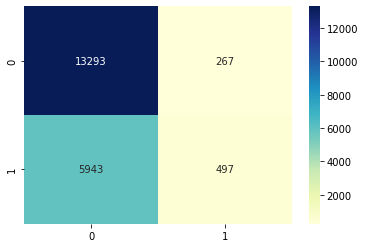

In [ ]:
# final

tabnet_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=1,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=1e-2),
                        scheduler_params={"step_size":50,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
max_epochs = 20
tabnet_clf.fit(
    X_train=X_train.values, y_train=y_train.values,
    eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
    eval_name=['train', 'valid'],
    eval_metric=['balanced_accuracy'],
    max_epochs=max_epochs, 
    patience=50,
    batch_size=1024, virtual_batch_size=128,
    num_workers=0,
    weights=1,
    drop_last=False
)
y_pred_tab = tabnet_clf.predict(X_valid.values)
tab_res = get_clf_eval(y_valid, y_pred_tab)
print(tab_res)

In [ ]:
plt.plot(tabnet_clf.history['loss'])

In [ ]:
y_pred_prob = tabnet_clf.predict_proba(X_valid)
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)

## tab test

Device used : cpu
auc 100
epoch 0  | loss: 0.70898 | train_auc: 0.56306 | valid_auc: 0.5513  |  0:00:47s
epoch 1  | loss: 0.68243 | train_auc: 0.60623 | valid_auc: 0.58213 |  0:01:25s
epoch 2  | loss: 0.66835 | train_auc: 0.63499 | valid_auc: 0.63058 |  0:02:03s
epoch 3  | loss: 0.66089 | train_auc: 0.6107  | valid_auc: 0.61417 |  0:02:40s
epoch 4  | loss: 0.66104 | train_auc: 0.6432  | valid_auc: 0.63132 |  0:03:17s
epoch 5  | loss: 0.6552  | train_auc: 0.63256 | valid_auc: 0.63369 |  0:03:53s
epoch 6  | loss: 0.65446 | train_auc: 0.64913 | valid_auc: 0.63662 |  0:04:29s
epoch 7  | loss: 0.65175 | train_auc: 0.66018 | valid_auc: 0.63608 |  0:05:05s
epoch 8  | loss: 0.64911 | train_auc: 0.68031 | valid_auc: 0.63479 |  0:05:41s
epoch 9  | loss: 0.63664 | train_auc: 0.66656 | valid_auc: 0.58786 |  0:06:17s
epoch 10 | loss: 0.63631 | train_auc: 0.70251 | valid_auc: 0.63539 |  0:06:52s
epoch 11 | loss: 0.62033 | train_auc: 0.70875 | valid_auc: 0.56655 |  0:07:29s
epoch 12 | loss: 0.6167  |

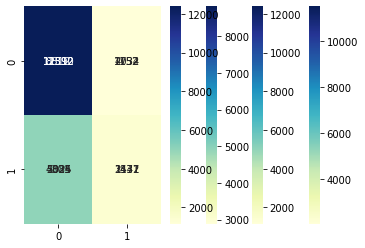

In [ ]:
# eval metric, epoc at Ir=1e-2
li100 = []

for change in ['auc', 'accuracy', 'balanced_accuracy', 'logloss']:
    for epoc in [100]:
        tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=10,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=2e-2),
                        scheduler_params={"step_size":50,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
        max_epochs = epoc
        print(change,epoc)
        tab_clf.fit(
            X_train=X_train.values, y_train=y_train.values,
            eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
            eval_name=['train', 'valid'],
            eval_metric=[change],
            max_epochs=max_epochs, 
            patience=50,
            batch_size=1024, virtual_batch_size=128,
            num_workers=0,
            weights=1,
            drop_last=False
        )
        y_pred_tab = tab_clf.predict(X_valid.values)
        res = {(change, epoc) : get_clf_eval(y_valid, y_pred_tab)}
        print(res)
        li100.append(res)
print(li100)

Device used : cpu
auc 100
epoch 0  | loss: 0.70774 | train_auc: 0.64913 | valid_auc: 0.49645 |  0:00:45s
epoch 1  | loss: 0.65244 | train_auc: 0.66642 | valid_auc: 0.55986 |  0:01:22s
epoch 2  | loss: 0.65117 | train_auc: 0.66514 | valid_auc: 0.49453 |  0:01:59s
epoch 3  | loss: 0.65089 | train_auc: 0.6699  | valid_auc: 0.63682 |  0:02:35s
epoch 4  | loss: 0.64992 | train_auc: 0.6697  | valid_auc: 0.63069 |  0:03:11s
epoch 5  | loss: 0.64973 | train_auc: 0.67026 | valid_auc: 0.62718 |  0:03:47s
epoch 6  | loss: 0.64812 | train_auc: 0.67048 | valid_auc: 0.61509 |  0:04:23s
epoch 7  | loss: 0.64817 | train_auc: 0.66669 | valid_auc: 0.51505 |  0:04:59s
epoch 8  | loss: 0.64837 | train_auc: 0.66814 | valid_auc: 0.55703 |  0:05:36s
epoch 9  | loss: 0.64902 | train_auc: 0.66737 | valid_auc: 0.55138 |  0:06:13s
epoch 10 | loss: 0.65014 | train_auc: 0.66827 | valid_auc: 0.55603 |  0:06:49s
epoch 11 | loss: 0.64697 | train_auc: 0.67106 | valid_auc: 0.54139 |  0:07:26s
epoch 12 | loss: 0.64804 |

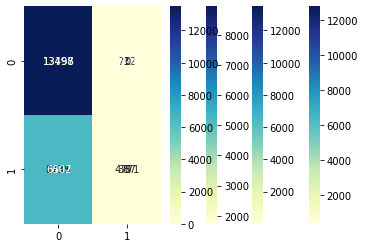

In [ ]:
# "step_size":10
li10 = []

for change in ['auc', 'accuracy', 'balanced_accuracy', 'logloss']:
    for epoc in [100]:
        tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=10,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=2e-2),
                        scheduler_params={"step_size":10,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
        max_epochs = epoc
        print(change,epoc)
        tab_clf.fit(
            X_train=X_train.values, y_train=y_train.values,
            eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
            eval_name=['train', 'valid'],
            eval_metric=[change],
            max_epochs=max_epochs, 
            patience=50,
            batch_size=1024, virtual_batch_size=128,
            num_workers=0,
            weights=1,
            drop_last=False
        )
        y_pred_tab = tab_clf.predict(X_valid.values)
        res = {(change, epoc) : get_clf_eval(y_valid, y_pred_tab)}
        print(res)
        li10.append(res)
print(li10)

Device used : cpu
auc 10
epoch 0  | loss: 0.71849 | train_auc: 0.55303 | valid_auc: 0.47682 |  0:00:43s
epoch 1  | loss: 0.68027 | train_auc: 0.5856  | valid_auc: 0.56977 |  0:01:22s
epoch 2  | loss: 0.67402 | train_auc: 0.6093  | valid_auc: 0.59088 |  0:02:01s
epoch 3  | loss: 0.66758 | train_auc: 0.62154 | valid_auc: 0.59176 |  0:02:40s
epoch 4  | loss: 0.66331 | train_auc: 0.61335 | valid_auc: 0.55688 |  0:03:19s
epoch 5  | loss: 0.66191 | train_auc: 0.62201 | valid_auc: 0.61631 |  0:03:59s
epoch 6  | loss: 0.6617  | train_auc: 0.63511 | valid_auc: 0.61899 |  0:04:37s
epoch 7  | loss: 0.65853 | train_auc: 0.62985 | valid_auc: 0.62457 |  0:05:16s
epoch 8  | loss: 0.65784 | train_auc: 0.64784 | valid_auc: 0.60926 |  0:05:54s
epoch 9  | loss: 0.65304 | train_auc: 0.65666 | valid_auc: 0.61803 |  0:06:32s
Stop training because you reached max_epochs = 10 with best_epoch = 7 and best_valid_auc = 0.62457
Best weights from best epoch are automatically used!

정확도accuracy: 0.6880
정밀도precision

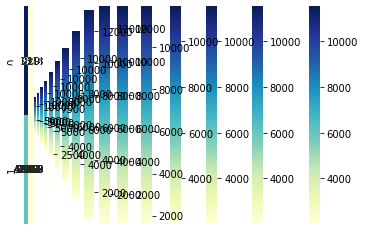

In [ ]:
# eval metric, epoc at Ir=1e-2
li = []

for change in ['auc', 'accuracy', 'balanced_accuracy', 'logloss']:
    for epoc in [10, 15, 20, 30]:
        tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=10,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=1e-2),
                        scheduler_params={"step_size":50,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
        max_epochs = epoc
        print(change,epoc)
        tab_clf.fit(
            X_train=X_train.values, y_train=y_train.values,
            eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
            eval_name=['train', 'valid'],
            eval_metric=[change],
            max_epochs=max_epochs, 
            patience=20,
            batch_size=1024, virtual_batch_size=128,
            num_workers=0,
            weights=1,
            drop_last=False
        )
        y_pred_tab = tab_clf.predict(X_valid.values)
        res = {(change, epoc) : get_clf_eval(y_valid, y_pred_tab)}
        print(res)
        li.append(res)
print(li)

Device used : cpu
auc 10
epoch 0  | loss: 0.70677 | train_auc: 0.55676 | valid_auc: 0.55619 |  0:00:37s
epoch 1  | loss: 0.68271 | train_auc: 0.59011 | valid_auc: 0.55778 |  0:01:15s
epoch 2  | loss: 0.67929 | train_auc: 0.60201 | valid_auc: 0.52027 |  0:01:53s
epoch 3  | loss: 0.67511 | train_auc: 0.61857 | valid_auc: 0.55343 |  0:02:31s
epoch 4  | loss: 0.66554 | train_auc: 0.65673 | valid_auc: 0.56083 |  0:03:12s
epoch 5  | loss: 0.64403 | train_auc: 0.70475 | valid_auc: 0.54309 |  0:03:50s
epoch 6  | loss: 0.61684 | train_auc: 0.73548 | valid_auc: 0.44898 |  0:04:28s
epoch 7  | loss: 0.60053 | train_auc: 0.74936 | valid_auc: 0.44839 |  0:05:06s
epoch 8  | loss: 0.59366 | train_auc: 0.6963  | valid_auc: 0.55761 |  0:05:44s
epoch 9  | loss: 0.58304 | train_auc: 0.76291 | valid_auc: 0.55782 |  0:06:22s
Stop training because you reached max_epochs = 10 with best_epoch = 4 and best_valid_auc = 0.56083
Best weights from best epoch are automatically used!

정확도accuracy: 0.3273
정밀도precision

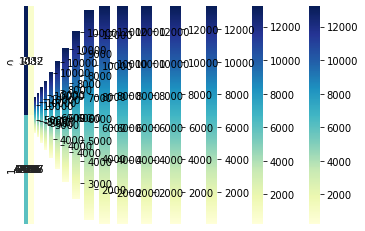

In [ ]:
# eval metric, epoc
li_default = []

for change in ['auc', 'accuracy', 'balanced_accuracy', 'logloss']:
    for epoc in [10, 15, 20, 30]:
        tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=10,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=2e-2),
                        scheduler_params={"step_size":50,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
        max_epochs = epoc
        print(change,epoc)
        tab_clf.fit(
            X_train=X_train.values, y_train=y_train.values,
            eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
            eval_name=['train', 'valid'],
            eval_metric=[change],
            max_epochs=max_epochs, 
            patience=20,
            batch_size=1024, virtual_batch_size=128,
            num_workers=0,
            weights=1,
            drop_last=False
        )
        y_pred_tab = tab_clf.predict(X_valid.values)
        res = {(change, epoc) : get_clf_eval(y_valid, y_pred_tab)}
        print(res)
        li_default.append(res)
print(li_default)

In [ ]:
#batchsize
li_batch = []

for bat in [512, 1024, 2048, 4096, 8192 ]:
    for vbat in [64, 128, 256]:
        tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                        cat_dims=cat_dims,
                        cat_emb_dim=10,
                        optimizer_fn=torch.optim.Adam,
                        optimizer_params=dict(lr=2e-2),
                        scheduler_params={"step_size":50,
                                            "gamma":0.9},
                        scheduler_fn=torch.optim.lr_scheduler.StepLR,
                        mask_type='sparsemax' # "sparsemax", entmax
                        )
        
        max_epochs = 30
        print(bat,vbat)
        tab_clf.fit(
            X_train=X_train.values, y_train=y_train.values,
            eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
            eval_name=['train', 'valid'],
            eval_metric=['accuracy'],
            max_epochs=max_epochs, 
            patience=20,
            batch_size=bat, virtual_batch_size=vbat,
            num_workers=0,
            weights=1,
            drop_last=False
        )
        y_pred_tab = tab_clf.predict(X_valid.values)
        res = {(change, epoc) : get_clf_eval(y_valid, y_pred_tab)}
        print(res)
        li_batch.append(res)
print(li_batch)

In [ ]:
tab_clf = TabNetClassifier(cat_idxs=cat_idxs,
                    cat_dims=cat_dims,
                    cat_emb_dim=1,
                    optimizer_fn=torch.optim.Adam,
                    optimizer_params=dict(lr=1e-2),
                    scheduler_params={"step_size":50,
                                        "gamma":0.9},
                    scheduler_fn=torch.optim.lr_scheduler.StepLR,
                    mask_type='sparsemax' # "sparsemax", entmax
                    )

Device used : cpu


In [ ]:
max_epochs = 10

tab_clf.fit(
    X_train=X_train.values, y_train=y_train.values,
    eval_set=[(X_train.values, y_train.values), (X_valid.values, y_valid.values)],
    eval_name=['train', 'valid'],
    eval_metric=['auc'],
    max_epochs=max_epochs, 
    patience=20,
    batch_size=1024, virtual_batch_size=128,
    num_workers=0,
    weights=1,
    drop_last=False
)

IndexError: ignored


정확도accuracy: 0.6908
정밀도precision: 0.7226
재현율recall: 0.0907
AUC: 0.5369
F1: 0.1612


{'AUC': 0.5368752288765796,
 'F1': 0.16117216117216115,
 '재현율recall': 0.09070087036188731,
 '정밀도precision': 0.7226277372262774,
 '정확도accuracy': 0.69085}

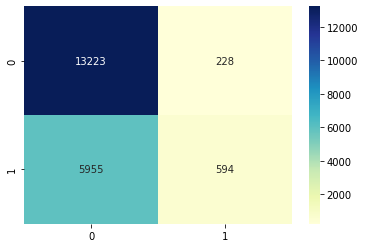

In [ ]:
y_pred_tab = tab_clf.predict(X_valid.values)
get_clf_eval(y_valid, y_pred_tab)


6


AttributeError: ignored

In [ ]:
# 제출 양식 다운로드
submit = pd.read_csv(os.path.join(folder, 'sample_submission.csv'))

# prediction 수행
df_test = pd.read_csv(os.path.join(folder, 'test.csv'))
df_test_drop = df_test.drop(columns=['ID'])
                            

 y_pred_tab = clf.predict(df_test_drop.values)
get_clf_eval(y_valid, y_pred_tab)
submit['answer'] = y_pred_tab
print(submit['answer'])


# preds = clf.predict(X_test)

IndentationError: ignored

In [ ]:
# 제출 파일 저장
submit.to_csv(os.path.join(folder, 'prediction.csv'), index=False)

In [ ]:
explain_matrix, masks = clf.explain(df_test_drop)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
for i in range(3):
    axs[i].imshow(masks[i][:50])
    axs[i].set_title(f"mask {i}")

KeyError: ignored

In [ ]:
from pytorch_tabnet.tab_model import TabNetClassifier, TabNetRegressor

clf = TabNetClassifier()  #TabNetRegressor()
clf.fit(
  X_train, y_train,
  eval_set=[(X_valid, y_valid)]
)
preds = clf.predict(X_test)

Device used : cpu


KeyError: ignored

#catboost   
https://catboost.ai/en/docs/concepts/python-reference_catboostclassifier_fit

In [10]:
!pip install catboost
from catboost import CatBoostClassifier, Pool, CatBoostRegressor

     |████████████████████████████████| 76.1 MB 52 kB/s 


In [11]:
from catboost import CatBoostClassifier, Pool, CatBoostRegressor

clf_cat = CatBoostClassifier()
# clf_cat = CatBoostRegressor(iterations=10000,
#                             learning_rate=0.01,
#                             depth=5, 
#                             eval_metric='RMSE',
#                             random_seed=23,
#                             early_stopping_rounds=200,
#                             logging_level='Verbose')


Learning rate set to 0.093535
0:	learn: 0.6690429	test: 0.6691017	test1: 0.6687785	best: 0.6687785 (0)	total: 81.7ms	remaining: 1m 21s
1:	learn: 0.6501671	test: 0.6502197	test1: 0.6497907	best: 0.6497907 (1)	total: 112ms	remaining: 56.1s
2:	learn: 0.6332403	test: 0.6332941	test1: 0.6326627	best: 0.6326627 (2)	total: 145ms	remaining: 48.1s
3:	learn: 0.6203941	test: 0.6204428	test1: 0.6197672	best: 0.6197672 (3)	total: 208ms	remaining: 51.8s
4:	learn: 0.6100884	test: 0.6101252	test1: 0.6093804	best: 0.6093804 (4)	total: 295ms	remaining: 58.8s
5:	learn: 0.6011771	test: 0.6012077	test1: 0.6004510	best: 0.6004510 (5)	total: 390ms	remaining: 1m 4s
6:	learn: 0.5930003	test: 0.5930261	test1: 0.5923750	best: 0.5923750 (6)	total: 471ms	remaining: 1m 6s
7:	learn: 0.5858606	test: 0.5858842	test1: 0.5852439	best: 0.5852439 (7)	total: 514ms	remaining: 1m 3s
8:	learn: 0.5807291	test: 0.5807516	test1: 0.5799232	best: 0.5799232 (8)	total: 549ms	remaining: 1m
9:	learn: 0.5762107	test: 0.5762314	test1: 0

{'AUC': 0.6897847001855426,
 'F1': 0.5705944798301485,
 '재현율recall': 0.4986856347610948,
 '정밀도precision': 0.6667355799048997,
 '정확도accuracy': 0.7573}

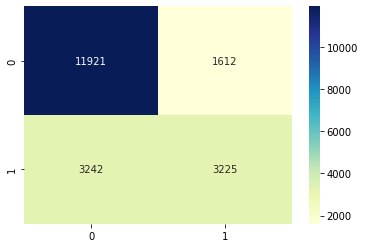

In [ ]:
max_epochs = 15

clf_cat.fit(
    X=X_train, y=y_train,
    eval_set=[(X_train, y_train), (X_valid, y_valid)],
    # eval_name=['train', 'valid'],
    # eval_metric=['balanced_accuracy'],
    # max_epochs=max_epochs , patience=20,
    # batch_size=1024, virtual_batch_size=128,
    # num_workers=0,
    # weights=1,
    # drop_last=False,
)
y_pred_vote = clf_cat.predict(X_valid)
get_clf_eval(y_valid, y_pred_vote)

# Ensemble(Voting)

In [ ]:
rnd_clf = RandomForestClassifier()
lgbm_clf = LGBMClassifier()
# xgb_clf = xgboost.XGBClassifier()

rid_clf = RidgeClassifier()
dtc_clf = DecisionTreeClassifier()
svm_clf = SVC()
ada_clf = AdaBoostClassifier()
gbc_clf = GradientBoostingClassifier()
bag_clf = BaggingClassifier()
ext_clf = ExtraTreesClassifier()
knn_clf = KNeighborsClassifier()
svc_clf = SVC()

# tabnet_clf = TabNetClassifier()
# cat_clf = CatBoostClassifier()

In [ ]:


voting_clf = VotingClassifier(estimators=[('cat',clf_cat),('rnd', rnd_clf), ('lgbm', lgbm_clf), ('xgb', xgb_clf),
                                           ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf)], voting='soft')

Learning rate set to 0.06692
0:	learn: 0.6755945	total: 81.2ms	remaining: 1m 21s
1:	learn: 0.6609884	total: 159ms	remaining: 1m 19s
2:	learn: 0.6482110	total: 237ms	remaining: 1m 18s
3:	learn: 0.6371750	total: 319ms	remaining: 1m 19s
4:	learn: 0.6277920	total: 399ms	remaining: 1m 19s
5:	learn: 0.6186216	total: 435ms	remaining: 1m 12s
6:	learn: 0.6105709	total: 496ms	remaining: 1m 10s
7:	learn: 0.6041784	total: 594ms	remaining: 1m 13s
8:	learn: 0.5981062	total: 667ms	remaining: 1m 13s
9:	learn: 0.5932907	total: 722ms	remaining: 1m 11s
10:	learn: 0.5883032	total: 771ms	remaining: 1m 9s
11:	learn: 0.5838985	total: 874ms	remaining: 1m 11s
12:	learn: 0.5798548	total: 957ms	remaining: 1m 12s
13:	learn: 0.5762535	total: 1.03s	remaining: 1m 12s
14:	learn: 0.5733391	total: 1.11s	remaining: 1m 12s
15:	learn: 0.5710342	total: 1.18s	remaining: 1m 12s
16:	learn: 0.5688912	total: 1.25s	remaining: 1m 12s
17:	learn: 0.5666523	total: 1.28s	remaining: 1m 10s
18:	learn: 0.5645817	total: 1.35s	remaining: 

{'AUC': 0.6645057318609902,
 'F1': 0.522378089512358,
 '재현율recall': 0.42322560692747796,
 '정밀도precision': 0.6822033898305084,
 '정확도accuracy': 0.74975}

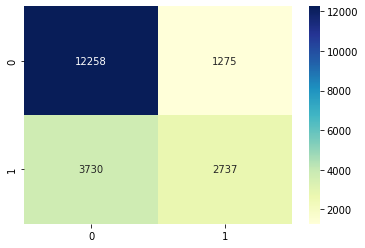

In [ ]:
voting_clf.fit(X_train, y_train)
y_pred_vote = voting_clf.predict(X_valid)
get_clf_eval(y_valid, y_pred_vote)

Learning rate set to 0.06692
0:	learn: 0.6756943	total: 95ms	remaining: 1m 34s
1:	learn: 0.6597335	total: 156ms	remaining: 1m 17s
2:	learn: 0.6469003	total: 213ms	remaining: 1m 10s
3:	learn: 0.6360037	total: 276ms	remaining: 1m 8s
4:	learn: 0.6265985	total: 309ms	remaining: 1m 1s
5:	learn: 0.6175617	total: 345ms	remaining: 57.1s
6:	learn: 0.6096017	total: 414ms	remaining: 58.7s
7:	learn: 0.6029239	total: 483ms	remaining: 59.9s
8:	learn: 0.5968911	total: 519ms	remaining: 57.1s
9:	learn: 0.5924015	total: 564ms	remaining: 55.8s
10:	learn: 0.5885136	total: 663ms	remaining: 59.6s
11:	learn: 0.5839751	total: 728ms	remaining: 59.9s
12:	learn: 0.5801771	total: 774ms	remaining: 58.8s
13:	learn: 0.5766869	total: 853ms	remaining: 1m
14:	learn: 0.5734344	total: 895ms	remaining: 58.8s
15:	learn: 0.5707184	total: 932ms	remaining: 57.3s
16:	learn: 0.5682898	total: 1s	remaining: 58.1s
17:	learn: 0.5660735	total: 1.09s	remaining: 59.4s
18:	learn: 0.5639563	total: 1.16s	remaining: 1m
19:	learn: 0.561987

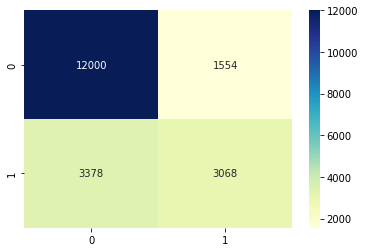

In [ ]:
for clf in (cat_clf,xgb_clf):
    clf.fit(X_train, y_train)
    y_pred_vote = clf.predict(X_valid)

# ensemble(voting) 성능 확인
get_clf_eval(y_valid, y_pred_vote)


정확도: 0.7530
정밀도: 0.6704
재현율: 0.4595
AUC: 0.6760
F1: 0.5453


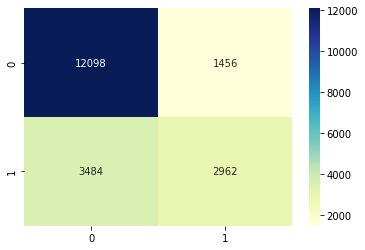

In [ ]:
get_clf_eval(y_valid, y_pred_vote)

In [ ]:
for clf in (tabnet_clf,cat_clf):
    clf.fit(X_train, y_train)
    y_pred_vote = clf.predict(X_valid)

# ensemble(voting) 성능 확인
get_clf_eval(y_valid, y_pred_vote)

NameError: ignored

#optimize

## lgbm opt

In [ ]:
!pip install scikit-optimize

     |████████████████████████████████| 100 kB 3.4 MB/s 


In [ ]:
from skopt import BayesSearchCV

In [ ]:
opt = BayesSearchCV(
    LGBMClassifier(),
    {
        'C': (1e-6, 1e+6, 'log-uniform'),
        'gamma': (1e-6, 1e+1, 'log-uniform'),
        'degree': (1, 8),  # integer valued parameter
        'kernel': ['linear', 'poly', 'rbf'],  # categorical parameter
    },
    n_iter=32,
    cv=3
)
opt.fit(X_train, y_train)




In [ ]:
y_pred_opt = opt.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_opt)

## xgb opt

## cat opt

In [ ]:
CBC = CatBoostClassifier()

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 3,4,5,6],
                'learning_rate' : [0.04],
                'iterations'    : [4000, 5000,6000,7000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring='accuracy')
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

0:	learn: 0.6827764	total: 24.4ms	remaining: 1m 37s
1:	learn: 0.6735712	total: 46.8ms	remaining: 1m 33s
2:	learn: 0.6648824	total: 71.5ms	remaining: 1m 35s
3:	learn: 0.6570274	total: 93.7ms	remaining: 1m 33s
4:	learn: 0.6498228	total: 119ms	remaining: 1m 35s
5:	learn: 0.6425949	total: 141ms	remaining: 1m 33s
6:	learn: 0.6362437	total: 164ms	remaining: 1m 33s
7:	learn: 0.6307655	total: 186ms	remaining: 1m 33s
8:	learn: 0.6254612	total: 209ms	remaining: 1m 32s
9:	learn: 0.6207153	total: 248ms	remaining: 1m 38s
10:	learn: 0.6163506	total: 269ms	remaining: 1m 37s
11:	learn: 0.6120908	total: 291ms	remaining: 1m 36s
12:	learn: 0.6076744	total: 314ms	remaining: 1m 36s
13:	learn: 0.6041871	total: 337ms	remaining: 1m 35s
14:	learn: 0.6008224	total: 360ms	remaining: 1m 35s
15:	learn: 0.5977539	total: 387ms	remaining: 1m 36s
16:	learn: 0.5950758	total: 408ms	remaining: 1m 35s
17:	learn: 0.5922570	total: 430ms	remaining: 1m 35s
18:	learn: 0.5894152	total: 457ms	remaining: 1m 35s
19:	learn: 0.58681

In [ ]:
Grid_CBC.cv_results_


{'mean_fit_time': array([115.36757731, 140.88567555, 176.18260682, 217.5504415 ,
        141.24463284, 179.35871637, 210.09284997, 237.02350247,
        154.03967071, 194.26434875, 231.58863974, 270.75639009,
        183.94979322, 230.63870704, 275.59115255, 320.85450172]),
 'mean_score_time': array([0.31590712, 0.36757731, 0.42481816, 0.55037761, 0.34674537,
        0.39687657, 0.45154488, 0.5250603 , 0.39822352, 0.41887951,
        0.49183261, 0.5926851 , 0.37677526, 0.44165003, 0.48104489,
        0.44730246]),
 'mean_test_score': array([0.7521125, 0.7518875, 0.7516875, 0.7511125, 0.7523375, 0.7516625,
        0.751125 , 0.7513625, 0.7526625, 0.75225  , 0.751375 , 0.7501125,
        0.75125  , 0.750075 , 0.749775 , 0.749225 ]),
 'param_depth': masked_array(data=[3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False],
        fill_value='?'

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 3,4,5,6],
                'learning_rate' : [0.04],
                'iterations'    : [4000, 5000,6000,7000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring=f1)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
10:	learn: 0.6163506	total: 252ms	remaining: 1m 54s
11:	learn: 0.6120908	total: 274ms	remaining: 1m 53s
12:	learn: 0.6076744	total: 296ms	remaining: 1m 53s
13:	learn: 0.6041871	total: 319ms	remaining: 1m 53s
14:	learn: 0.6008224	total: 341ms	remaining: 1m 53s
15:	learn: 0.5977539	total: 364ms	remaining: 1m 53s
16:	learn: 0.5950758	total: 385ms	remaining: 1m 52s
17:	learn: 0.5922570	total: 407ms	remaining: 1m 52s
18:	learn: 0.5894152	total: 432ms	remaining: 1m 53s
19:	learn: 0.5868178	total: 456ms	remaining: 1m 53s
20:	learn: 0.5846981	total: 481ms	remaining: 1m 54s
21:	learn: 0.5829342	total: 503ms	remaining: 1m 53s
22:	learn: 0.5811608	total: 525ms	remaining: 1m 53s
23:	learn: 0.5792870	total: 548ms	remaining: 1m 53s
24:	learn: 0.5778811	total: 571ms	remaining: 1m 53s
25:	learn: 0.5762603	total: 593ms	remaining: 1m 53s
26:	learn: 0.5746776	total: 613ms	remaining: 1m 52s
27:	learn: 0.5730667	total: 639ms	remaining: 1m 53s
28:	learn: 0.5717296	total: 

In [ ]:
Grid_CBC.cv_results_


{'mean_fit_time': array([112.50790024, 142.67848587, 167.68161392, 197.27243495,
        135.95773077, 170.27496719, 215.10389733, 260.07350993,
        170.85438073, 217.31633151, 249.9321121 , 275.10908675,
        182.72903204, 229.57844734, 276.5925982 , 320.6008271 ]),
 'mean_score_time': array([0.33815563, 0.40196443, 0.44171119, 0.5184983 , 0.34477365,
        0.42400682, 0.51999211, 0.59496403, 0.42329431, 0.46659899,
        0.49739254, 0.62762094, 0.41686654, 0.478778  , 0.50112939,
        0.47127438]),
 'mean_test_score': array([0.69228502, 0.69278722, 0.69305272, 0.6927957 , 0.69440531,
        0.69435639, 0.69429443, 0.69513157, 0.6958347 , 0.69611093,
        0.69550336, 0.69455351, 0.69506851, 0.69443425, 0.69465061,
        0.6942811 ]),
 'param_depth': masked_array(data=[3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False]

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 3,4,5],
                'learning_rate' : [0.04],
                'iterations'    : [2000,2500,3000,3500,4000,4500,5000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring=f1)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
10:	learn: 0.6163506	total: 296ms	remaining: 2m 14s
11:	learn: 0.6120908	total: 317ms	remaining: 2m 11s
12:	learn: 0.6076744	total: 341ms	remaining: 2m 10s
13:	learn: 0.6041871	total: 364ms	remaining: 2m 9s
14:	learn: 0.6008224	total: 387ms	remaining: 2m 8s
15:	learn: 0.5977539	total: 411ms	remaining: 2m 8s
16:	learn: 0.5950758	total: 434ms	remaining: 2m 7s
17:	learn: 0.5922570	total: 455ms	remaining: 2m 5s
18:	learn: 0.5894152	total: 492ms	remaining: 2m 8s
19:	learn: 0.5868178	total: 518ms	remaining: 2m 8s
20:	learn: 0.5846981	total: 540ms	remaining: 2m 8s
21:	learn: 0.5829342	total: 562ms	remaining: 2m 7s
22:	learn: 0.5811608	total: 585ms	remaining: 2m 6s
23:	learn: 0.5792870	total: 608ms	remaining: 2m 6s
24:	learn: 0.5778811	total: 631ms	remaining: 2m 5s
25:	learn: 0.5762603	total: 653ms	remaining: 2m 4s
26:	learn: 0.5746776	total: 674ms	remaining: 2m 4s
27:	learn: 0.5730667	total: 699ms	remaining: 2m 4s
28:	learn: 0.5717296	total: 722ms	remaining

In [ ]:
Grid_CBC.cv_results_


{'mean_fit_time': array([ 70.64060855,  69.57517922,  83.33972597,  99.27305973,
        114.3843832 , 131.69847763, 144.90670109,  68.35271406,
         84.89697063, 100.37016749, 118.43978155, 133.68591797,
        152.65135109, 169.24802434,  76.7200104 ,  97.00796688,
        117.6026175 , 134.99419272, 154.08615947, 173.27632761,
        193.32006657]),
 'mean_score_time': array([0.25498366, 0.24765182, 0.28957093, 0.30005836, 0.37705398,
        0.37775016, 0.4068867 , 0.23595846, 0.28200746, 0.32948124,
        0.31950617, 0.33727396, 0.37846339, 0.44470739, 0.26751208,
        0.2778641 , 0.31311774, 0.35478985, 0.39012992, 0.40903366,
        0.4805814 ]),
 'mean_test_score': array([0.6878064 , 0.69020513, 0.6916766 , 0.69201693, 0.69228502,
        0.69269345, 0.69278722, 0.69199151, 0.69322626, 0.69384102,
        0.69416356, 0.69440531, 0.69440497, 0.69435639, 0.69441881,
        0.69472592, 0.69508774, 0.69509795, 0.6958347 , 0.69595671,
        0.69611093]),
 'param_depth

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 4,5,6],
                'learning_rate' : [0.04],
                'iterations'    : [5000,6000,7000,8000,9000,10000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring=f1)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
10:	learn: 0.6163506	total: 248ms	remaining: 1m 52s
11:	learn: 0.6120908	total: 272ms	remaining: 1m 52s
12:	learn: 0.6076744	total: 294ms	remaining: 1m 52s
13:	learn: 0.6041871	total: 317ms	remaining: 1m 52s
14:	learn: 0.6008224	total: 339ms	remaining: 1m 52s
15:	learn: 0.5977539	total: 361ms	remaining: 1m 52s
16:	learn: 0.5950758	total: 383ms	remaining: 1m 52s
17:	learn: 0.5922570	total: 403ms	remaining: 1m 51s
18:	learn: 0.5894152	total: 431ms	remaining: 1m 52s
19:	learn: 0.5868178	total: 465ms	remaining: 1m 55s
20:	learn: 0.5846981	total: 487ms	remaining: 1m 55s
21:	learn: 0.5829342	total: 509ms	remaining: 1m 55s
22:	learn: 0.5811608	total: 531ms	remaining: 1m 55s
23:	learn: 0.5792870	total: 555ms	remaining: 1m 54s
24:	learn: 0.5778811	total: 577ms	remaining: 1m 54s
25:	learn: 0.5762603	total: 601ms	remaining: 1m 55s
26:	learn: 0.5746776	total: 623ms	remaining: 1m 54s
27:	learn: 0.5730667	total: 649ms	remaining: 1m 55s
28:	learn: 0.5717296	total: 

In [ ]:
Grid_CBC.cv_results_


{'mean_fit_time': array([168.76986253, 202.61842048, 236.5226109 , 268.62131596,
        303.80144429, 341.64481223, 195.23688459, 232.6564256 ,
        271.92781889, 312.58937931, 349.10827112, 389.04206467,
        228.8434757 , 275.47685432, 319.24040866, 363.40366852,
        414.02734923, 455.20126474]),
 'mean_score_time': array([0.43681955, 0.46663857, 0.55787826, 0.63144028, 0.6501112 ,
        0.74486244, 0.47557306, 0.52097356, 0.58877385, 0.65175486,
        0.70202398, 0.79005384, 0.46955717, 0.53999066, 0.60367334,
        0.67974865, 0.67369688, 0.65047753]),
 'mean_test_score': array([0.69435639, 0.69429443, 0.69513157, 0.69463202, 0.69410272,
        0.69336552, 0.69611093, 0.69550336, 0.69455351, 0.69401335,
        0.69346028, 0.69291299, 0.69443425, 0.69465061, 0.6942811 ,
        0.69339441, 0.69350106, 0.69335114]),
 'param_depth': masked_array(data=[4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6],
              mask=[False, False, False, False, False, False,

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 2,5,7,10],
                'learning_rate' : [0.04],
                'iterations'    : [7000,8000,9000,10000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring=f1)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

KeyboardInterrupt: ignored

In [ ]:
Grid_CBC.cv_results_


In [ ]:
{'mean_fit_time': array([ 167.7864548 ,  193.82347023,  215.40302718,  239.79600179,
         276.9867419 ,  318.78628707,  355.90834117,  396.58762431,
         396.29658341,  450.96240854,  514.65534341,  572.97351086,
        1233.14074957, 1439.78640413, 1561.08987498, 1739.78039694]),
 'mean_score_time': array([0.4837507 , 0.53052521, 0.58451927, 0.61908758, 0.58256745,
        0.65394926, 0.62815821, 0.79397297, 0.71486461, 0.81596982,
        1.77244473, 1.18258429, 2.59317958, 4.21455193, 4.39891994,
        4.24132216]),
 'mean_test_score': array([0.68837283, 0.68891499, 0.68993652, 0.69038606, 0.69531572,
        0.69464555, 0.6946432 , 0.6937435 , 0.69048484, 0.69028495,
        0.68922348, 0.68989337, 0.68785346, 0.68765409, 0.68715533,
        0.68744816]),
 'param_depth': masked_array(data=[2, 2, 2, 2, 5, 5, 5, 5, 7, 7, 7, 7, 10, 10, 10, 10],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_iterations': masked_array(data=[7000, 8000, 9000, 10000, 7000, 8000, 9000, 10000, 7000,
                    8000, 9000, 10000, 7000, 8000, 9000, 10000],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_learning_rate': masked_array(data=[0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04,
                    0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'depth': 2, 'iterations': 7000, 'learning_rate': 0.04},
  {'depth': 2, 'iterations': 8000, 'learning_rate': 0.04},
  {'depth': 2, 'iterations': 9000, 'learning_rate': 0.04},
  {'depth': 2, 'iterations': 10000, 'learning_rate': 0.04},
  {'depth': 5, 'iterations': 7000, 'learning_rate': 0.04},
  {'depth': 5, 'iterations': 8000, 'learning_rate': 0.04},
  {'depth': 5, 'iterations': 9000, 'learning_rate': 0.04},
  {'depth': 5, 'iterations': 10000, 'learning_rate': 0.04},
  {'depth': 7, 'iterations': 7000, 'learning_rate': 0.04},
  {'depth': 7, 'iterations': 8000, 'learning_rate': 0.04},
  {'depth': 7, 'iterations': 9000, 'learning_rate': 0.04},
  {'depth': 7, 'iterations': 10000, 'learning_rate': 0.04},
  {'depth': 10, 'iterations': 7000, 'learning_rate': 0.04},
  {'depth': 10, 'iterations': 8000, 'learning_rate': 0.04},
  {'depth': 10, 'iterations': 9000, 'learning_rate': 0.04},
  {'depth': 10, 'iterations': 10000, 'learning_rate': 0.04}],
 'rank_test_score': array([12, 11,  8,  6,  1,  2,  3,  4,  5,  7, 10,  9, 13, 14, 16, 15],
       dtype=int32),
 'split0_test_score': array([0.69102664, 0.69203258, 0.69286316, 0.69369937, 0.69915951,
        0.69883722, 0.69823309, 0.69750056, 0.69316721, 0.69285443,
        0.69193595, 0.69252407, 0.69047286, 0.69012306, 0.68975095,
        0.69026302]),
 'split1_test_score': array([0.68571903, 0.6857974 , 0.68700989, 0.68707276, 0.69147193,
        0.69045388, 0.69105331, 0.68998644, 0.68780246, 0.68771546,
        0.68651101, 0.68726267, 0.68523405, 0.68518513, 0.68455972,
        0.68463331]),
 'std_fit_time': array([0.39826763, 0.59767258, 1.333799  , 0.23525345, 0.51541173,
        0.16618967, 0.95080328, 0.71660781, 0.28310585, 0.4566226 ,
        0.40582502, 1.73378694, 2.93008482, 5.81168079, 4.90834355,
        3.68742657]),
 'std_score_time': array([0.00718653, 0.00333786, 0.00884235, 0.00774109, 0.02376676,
        0.00556517, 0.01870668, 0.01836276, 0.04951179, 0.06615794,
        0.18450189, 0.08063507, 0.1603564 , 0.00470066, 0.04280603,
        1.84593761]),
 'std_test_score': array([0.0026538 , 0.00311759, 0.00292663, 0.00331331, 0.00384379,
        0.00419167, 0.00358989, 0.00375706, 0.00268238, 0.00256949,
        0.00271247, 0.0026307 , 0.0026194 , 0.00246897, 0.00259561,
        0.00281486])}

In [ ]:
Grid_CBC.refit 

True

In [ ]:
from sklearn.metrics import f1_score, make_scorer
f1 = make_scorer(f1_score , average='macro')

parameters = {'depth'         : [ 2,5,7,10],
                'learning_rate' : [0.04],
                'iterations'    : [10000]
                }
Grid_CBC = GridSearchCV(estimator=CBC, param_grid = parameters, cv = 2, n_jobs=-1, scoring=f1)
Grid_CBC.fit(X_train, y_train)
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",Grid_CBC.best_estimator_)
print("\n The best score across ALL searched params:\n",Grid_CBC.best_score_)
print("\n The best parameters across ALL searched params:\n",Grid_CBC.best_params_)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5010:	learn: 0.4042939	total: 2m 2s	remaining: 2m 2s
5011:	learn: 0.4042718	total: 2m 2s	remaining: 2m 2s
5012:	learn: 0.4042654	total: 2m 2s	remaining: 2m 2s
5013:	learn: 0.4042430	total: 2m 2s	remaining: 2m 2s
5014:	learn: 0.4042261	total: 2m 2s	remaining: 2m 2s
5015:	learn: 0.4042143	total: 2m 2s	remaining: 2m 1s
5016:	learn: 0.4042090	total: 2m 2s	remaining: 2m 1s
5017:	learn: 0.4041905	total: 2m 2s	remaining: 2m 1s
5018:	learn: 0.4041713	total: 2m 2s	remaining: 2m 1s
5019:	learn: 0.4041542	total: 2m 2s	remaining: 2m 1s
5020:	learn: 0.4041349	total: 2m 2s	remaining: 2m 1s
5021:	learn: 0.4041237	total: 2m 2s	remaining: 2m 1s
5022:	learn: 0.4041130	total: 2m 2s	remaining: 2m 1s
5023:	learn: 0.4041120	total: 2m 2s	remaining: 2m 1s
5024:	learn: 0.4040977	total: 2m 2s	remaining: 2m 1s
5025:	learn: 0.4040894	total: 2m 3s	remaining: 2m 1s
5026:	learn: 0.4040791	total: 2m 3s	remaining: 2m 1s
5027:	learn: 0.4040630	total: 2m 3s	remaining: 2m 1s
5028:	lear

In [ ]:
cat_clf_def2 = CatBoostClassifier(depth= 2, iterations = 10000, learning_rate= 0.04 )
cat_clf_def5 = CatBoostClassifier(depth= 5, iterations = 10000, learning_rate= 0.04 )
cat_clf_def10 = CatBoostClassifier(depth= 10, iterations = 10000, learning_rate= 0.04 )

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5006:	learn: 0.4883753	total: 1m 37s	remaining: 1m 37s
5007:	learn: 0.4883725	total: 1m 37s	remaining: 1m 37s
5008:	learn: 0.4883678	total: 1m 37s	remaining: 1m 37s
5009:	learn: 0.4883634	total: 1m 37s	remaining: 1m 37s
5010:	learn: 0.4883597	total: 1m 37s	remaining: 1m 37s
5011:	learn: 0.4883556	total: 1m 37s	remaining: 1m 37s
5012:	learn: 0.4883514	total: 1m 37s	remaining: 1m 36s
5013:	learn: 0.4883497	total: 1m 37s	remaining: 1m 36s
5014:	learn: 0.4883473	total: 1m 37s	remaining: 1m 36s
5015:	learn: 0.4883438	total: 1m 37s	remaining: 1m 36s
5016:	learn: 0.4883409	total: 1m 37s	remaining: 1m 36s
5017:	learn: 0.4883357	total: 1m 37s	remaining: 1m 36s
5018:	learn: 0.4883333	total: 1m 37s	remaining: 1m 36s
5019:	learn: 0.4883319	total: 1m 37s	remaining: 1m 36s
5020:	learn: 0.4883282	total: 1m 37s	remaining: 1m 36s
5021:	learn: 0.4883248	total: 1m 37s	remaining: 1m 36s
5022:	learn: 0.4883229	total: 1m 37s	remaining: 1m 36s
5023:	learn: 0.4883203	total:

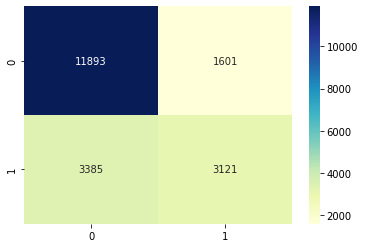

In [ ]:
res = []
cat_clf_def2.fit(X_train, y_train)
y_pred_stack = cat_clf_def2.predict(X_valid)
# ensemble(stacking) 성능 확인
res.append(get_clf_eval(y_valid, y_pred_stack))



스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5006:	learn: 0.4044934	total: 1m 58s	remaining: 1m 57s
5007:	learn: 0.4044792	total: 1m 58s	remaining: 1m 57s
5008:	learn: 0.4044649	total: 1m 58s	remaining: 1m 57s
5009:	learn: 0.4044470	total: 1m 58s	remaining: 1m 57s
5010:	learn: 0.4044229	total: 1m 58s	remaining: 1m 57s
5011:	learn: 0.4044118	total: 1m 58s	remaining: 1m 57s
5012:	learn: 0.4043970	total: 1m 58s	remaining: 1m 57s
5013:	learn: 0.4043880	total: 1m 58s	remaining: 1m 57s
5014:	learn: 0.4043659	total: 1m 58s	remaining: 1m 57s
5015:	learn: 0.4043540	total: 1m 58s	remaining: 1m 57s
5016:	learn: 0.4043426	total: 1m 58s	remaining: 1m 57s
5017:	learn: 0.4043259	total: 1m 58s	remaining: 1m 57s
5018:	learn: 0.4043158	total: 1m 58s	remaining: 1m 57s
5019:	learn: 0.4043055	total: 1m 58s	remaining: 1m 57s
5020:	learn: 0.4042826	total: 1m 58s	remaining: 1m 57s
5021:	learn: 0.4042742	total: 1m 58s	remaining: 1m 57s
5022:	learn: 0.4042644	total: 1m 58s	remaining: 1m 57s
5023:	learn: 0.4042482	total:

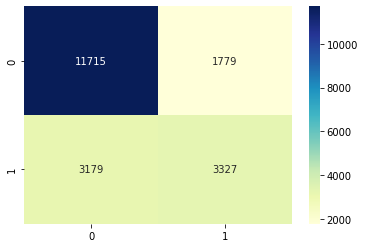

In [ ]:
cat_clf_def5.fit(X_train, y_train)
y_pred_stack = cat_clf_def5.predict(X_valid)
# ensemble(stacking) 성능 확인
res.append(get_clf_eval(y_valid, y_pred_stack))

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5007:	learn: 0.0961909	total: 9m 7s	remaining: 9m 6s
5008:	learn: 0.0961595	total: 9m 8s	remaining: 9m 6s
5009:	learn: 0.0961079	total: 9m 8s	remaining: 9m 6s
5010:	learn: 0.0960799	total: 9m 8s	remaining: 9m 5s
5011:	learn: 0.0960382	total: 9m 8s	remaining: 9m 5s
5012:	learn: 0.0960074	total: 9m 8s	remaining: 9m 5s
5013:	learn: 0.0959858	total: 9m 8s	remaining: 9m 5s
5014:	learn: 0.0959745	total: 9m 8s	remaining: 9m 5s
5015:	learn: 0.0959437	total: 9m 8s	remaining: 9m 5s
5016:	learn: 0.0959160	total: 9m 8s	remaining: 9m 5s
5017:	learn: 0.0959108	total: 9m 9s	remaining: 9m 5s
5018:	learn: 0.0958710	total: 9m 9s	remaining: 9m 5s
5019:	learn: 0.0958599	total: 9m 9s	remaining: 9m 4s
5020:	learn: 0.0958433	total: 9m 9s	remaining: 9m 4s
5021:	learn: 0.0958263	total: 9m 9s	remaining: 9m 4s
5022:	learn: 0.0958005	total: 9m 9s	remaining: 9m 4s
5023:	learn: 0.0957696	total: 9m 9s	remaining: 9m 4s
5024:	learn: 0.0957417	total: 9m 9s	remaining: 9m 4s
5025:	lear

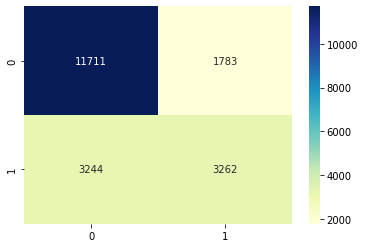

In [ ]:
cat_clf_def10.fit(X_train, y_train)
y_pred_stack = cat_clf_def10.predict(X_valid)
# ensemble(stacking) 성능 확인
res.append(get_clf_eval(y_valid, y_pred_stack))

print(res)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
10:	learn: 0.5928017	total: 273ms	remaining: 24.5s
11:	learn: 0.5885855	total: 295ms	remaining: 24.3s
12:	learn: 0.5844807	total: 318ms	remaining: 24.1s
13:	learn: 0.5807651	total: 340ms	remaining: 23.9s
14:	learn: 0.5774048	total: 362ms	remaining: 23.8s
15:	learn: 0.5747969	total: 386ms	remaining: 23.7s
16:	learn: 0.5722261	total: 418ms	remaining: 24.2s
17:	learn: 0.5698893	total: 445ms	remaining: 24.3s
18:	learn: 0.5675038	total: 467ms	remaining: 24.1s
19:	learn: 0.5657084	total: 491ms	remaining: 24.1s
20:	learn: 0.5635388	total: 514ms	remaining: 24s
21:	learn: 0.5617699	total: 535ms	remaining: 23.8s
22:	learn: 0.5601359	total: 558ms	remaining: 23.7s
23:	learn: 0.5584137	total: 581ms	remaining: 23.6s
24:	learn: 0.5570744	total: 603ms	remaining: 23.5s
25:	learn: 0.5558760	total: 639ms	remaining: 24s
26:	learn: 0.5547762	total: 661ms	remaining: 23.8s
27:	learn: 0.5537961	total: 684ms	remaining: 23.7s
28:	learn: 0.5528833	total: 712ms	remaining: 23.8s

{'AUC': 0.6935428736962759,
 'F1': 0.5795966987152217,
 '재현율recall': 0.5235167537657547,
 '정밀도precision': 0.6491328378120831,
 '정확도accuracy': 0.75295}

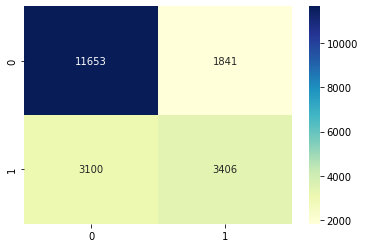

In [ ]:
stacking_clf = StackingClassifier(estimators=[('2', cat_clf_def2), ('5', cat_clf_def5), ('10', cat_clf_def10),('cat',clf_cat)], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
[{'정확도accuracy': 0.75295, '정밀도precision': 0.6636264929424539, '재현율recall': 0.4739454094292804, 'AUC': 0.6798224685871312, 'F1': 0.5529720437890165},
 {'정확도accuracy': 0.74895, '정밀도precision': 0.6452269489110523, '재현율recall': 0.49162531017369726, 'AUC': 0.6815048038471792, 'F1': 0.5580494674764546}]


In [ ]:
cat_clf = CatBoostClassifier(depth= 10, iterations = 100, learning_rate= 0.04
                            #  ,fold_len_multiplier=2
                             )

## rnd opt

# Ensemble(Stacking)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
10:	learn: 0.5931792	total: 260ms	remaining: 23.4s
11:	learn: 0.5889320	total: 284ms	remaining: 23.4s
12:	learn: 0.5847184	total: 307ms	remaining: 23.3s
13:	learn: 0.5813027	total: 330ms	remaining: 23.3s
14:	learn: 0.5782779	total: 352ms	remaining: 23.1s
15:	learn: 0.5756674	total: 377ms	remaining: 23.2s
16:	learn: 0.5725936	total: 400ms	remaining: 23.1s
17:	learn: 0.5703513	total: 428ms	remaining: 23.4s
18:	learn: 0.5679266	total: 452ms	remaining: 23.3s
19:	learn: 0.5660560	total: 472ms	remaining: 23.1s
20:	learn: 0.5642648	total: 494ms	remaining: 23s
21:	learn: 0.5623748	total: 517ms	remaining: 23s
22:	learn: 0.5606568	total: 541ms	remaining: 23s
23:	learn: 0.5589580	total: 565ms	remaining: 23s
24:	learn: 0.5576677	total: 587ms	remaining: 22.9s
25:	learn: 0.5561772	total: 608ms	remaining: 22.8s
26:	learn: 0.5548057	total: 636ms	remaining: 22.9s
27:	learn: 0.5536809	total: 660ms	remaining: 22.9s
28:	learn: 0.5526450	total: 682ms	remaining: 22.8s
29:

{'AUC': 0.6992993982683156,
 'F1': 0.5872267466780968,
 '재현율recall': 0.5296118756765115,
 '정밀도precision': 0.6589072720277029,
 '정확도accuracy': 0.75925}

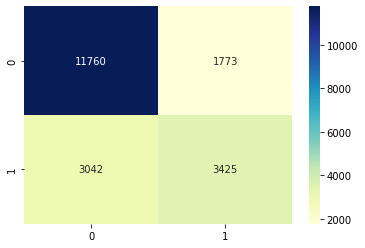

In [ ]:
stacking_clf = StackingClassifier(estimators=[('rnd', rnd_clf), ('lgbm', lgbm_clf), ('xgb', xgb_clf),('cat',clf_cat)], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
import itertools
from itertools import permutations
lists = [('cat',cat_clf),('rnd', rnd_clf), ('lgbm', lgbm_clf), ('xgb', xgb_clf),  ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf)]
result = []
i = 8
t=0
for j in permutations(lists, i):
    t+=1
    print(t)
    j = list(j)
    print(j)
    try:
        voting_clf = VotingClassifier(estimators=j ,  voting='soft')
        voting_clf.fit(X_train, y_train)
        y_pred_stack = voting_clf.predict(X_valid)

        # ensemble(stacking) 성능 확인
        r = get_clf_eval(y_valid, y_pred_stack)
        result.append((j, r))
        print((j, r))
    except:
        print((j, "ERROR OCCURRED"))
        result.append((j, "ERROR OCCURRED"))


스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
40:	learn: 0.5403068	total: 1.14s	remaining: 26.7s
41:	learn: 0.5393484	total: 1.17s	remaining: 26.6s
42:	learn: 0.5388949	total: 1.19s	remaining: 26.6s
43:	learn: 0.5383536	total: 1.22s	remaining: 26.5s
44:	learn: 0.5379683	total: 1.25s	remaining: 26.4s
45:	learn: 0.5373633	total: 1.27s	remaining: 26.4s
46:	learn: 0.5366414	total: 1.31s	remaining: 26.6s
47:	learn: 0.5359965	total: 1.34s	remaining: 26.6s
48:	learn: 0.5353030	total: 1.36s	remaining: 26.5s
49:	learn: 0.5349396	total: 1.39s	remaining: 26.4s
50:	learn: 0.5346372	total: 1.41s	remaining: 26.3s
51:	learn: 0.5339642	total: 1.44s	remaining: 26.2s
52:	learn: 0.5333532	total: 1.46s	remaining: 26.2s
53:	learn: 0.5328120	total: 1.5s	remaining: 26.2s
54:	learn: 0.5323470	total: 1.52s	remaining: 26.1s
55:	learn: 0.5320429	total: 1.55s	remaining: 26.1s
56:	learn: 0.5313890	total: 1.58s	remaining: 26.1s
57:	learn: 0.5310896	total: 1.6s	remaining: 26s
58:	learn: 0.5305498	total: 1.63s	remaining: 26s
5

# each stack

## lgbmstack

In [ ]:
lgbm_clf_gbdt = LGBMClassifier(boosting_type = 'gbdt')
lgbm_clf_rf_L1 =  LGBMClassifier(boosting_type="rf",
                         num_leaves=165,
                         colsample_bytree=.5,
                         n_estimators=400,
                         min_child_weight=5,
                         min_child_samples=10,
                         subsample=.632, # Standard RF bagging fraction
                         subsample_freq=1,
                         min_split_gain=0,
                         reg_alpha=10, # Hard L1 regularization
                         reg_lambda=0,
                         n_jobs=3)
lgbm_clf_rf_L2 =  LGBMClassifier(boosting_type="rf",
                         num_leaves=165,
                         colsample_bytree=.5,
                         n_estimators=400,
                         min_child_weight=5,
                         min_child_samples=10,
                         subsample=.632,
                         subsample_freq=1,
                         min_split_gain=0,
                         reg_alpha=0,
                         reg_lambda=5, # L2 regularization
                         n_jobs=3)
lgbm_clf_dart = LGBMClassifier(boosting_type = 'dart')
lgbm_clf_goss = LGBMClassifier(boosting_type = 'goss')


정확도accuracy: 0.7611
정밀도precision: 0.6787
재현율recall: 0.4824
AUC: 0.6874
F1: 0.5640


{'AUC': 0.6874060767076252,
 'F1': 0.5639996350697929,
 '재현율recall': 0.48244108006867487,
 '정밀도precision': 0.678743961352657,
 '정확도accuracy': 0.76105}

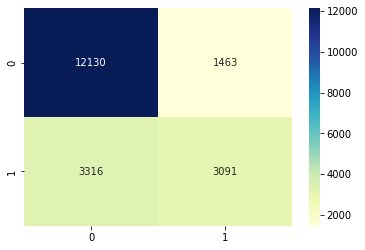

In [ ]:
lgbm_clf_gbdt.fit(X_train, y_train)
y_pred_stack = lgbm_clf_gbdt.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7235
정밀도precision: 0.7386
재현율recall: 0.2116
AUC: 0.5882
F1: 0.3290


{'AUC': 0.5881656109067697,
 'F1': 0.32900642969792554,
 '재현율recall': 0.21164351490557204,
 '정밀도precision': 0.738562091503268,
 '정확도accuracy': 0.72345}

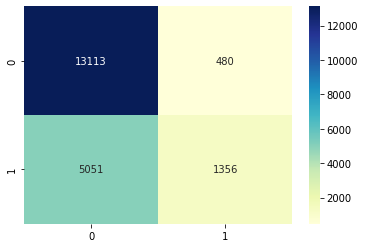

In [ ]:
lgbm_clf_rf_L1.fit(X_train, y_train)
y_pred_stack = lgbm_clf_rf_L1.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7290
정밀도precision: 0.7439
재현율recall: 0.2349
AUC: 0.5984
F1: 0.3571


{'AUC': 0.5983957396152876,
 'F1': 0.3570581257413998,
 '재현율recall': 0.2348993288590604,
 '정밀도precision': 0.7439446366782007,
 '정확도accuracy': 0.729}

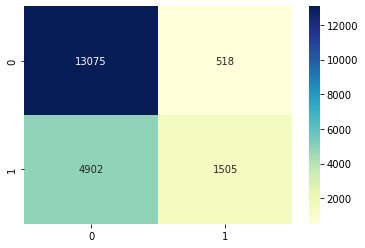

In [ ]:
lgbm_clf_rf_L2.fit(X_train, y_train)
y_pred_stack = lgbm_clf_rf_L2.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7567
정밀도precision: 0.6846
재현율recall: 0.4459
AUC: 0.6746
F1: 0.5401


{'AUC': 0.6745519948587646,
 'F1': 0.5400756143667297,
 '재현율recall': 0.44591852661151865,
 '정밀도precision': 0.68463934819075,
 '정확도accuracy': 0.7567}

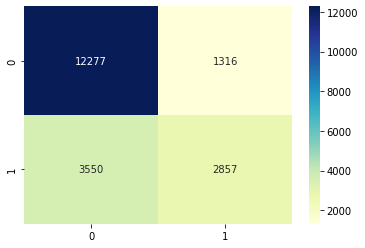

In [ ]:
lgbm_clf_dart.fit(X_train, y_train)
y_pred_stack = lgbm_clf_dart.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7581
정밀도precision: 0.6698
재현율recall: 0.4829
AUC: 0.6854
F1: 0.5612


{'AUC': 0.6853596100445157,
 'F1': 0.5612189370578633,
 '재현율recall': 0.4829093179335102,
 '정밀도precision': 0.6698419571335787,
 '정확도accuracy': 0.7581}

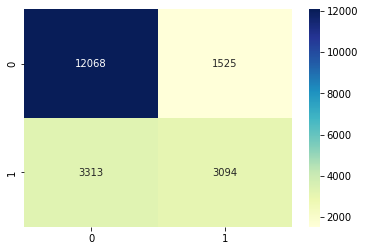

In [ ]:
lgbm_clf_goss.fit(X_train, y_train)
y_pred_stack = lgbm_clf_goss.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7621
정밀도precision: 0.6665
재현율recall: 0.5155
AUC: 0.6970
F1: 0.5814


{'AUC': 0.6969615899240088,
 'F1': 0.5813605561911467,
 '재현율recall': 0.5155298891837053,
 '정밀도precision': 0.6664648910411622,
 '정확도accuracy': 0.76215}

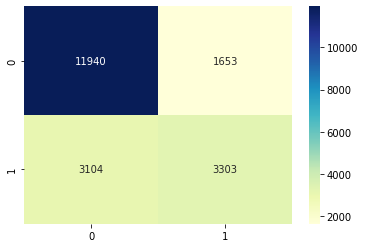

In [ ]:
stacking_lgbm_clf = StackingClassifier(estimators=[('gbdt', lgbm_clf_gbdt), ('rf1', lgbm_clf_rf_L1),  ('dart', lgbm_clf_dart),('goss',lgbm_clf_goss)], final_estimator = LGBMClassifier())
stacking_lgbm_clf.fit(X_train, y_train)
y_pred_stack = stacking_lgbm_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

## cat stack

### cat opt

In [ ]:
cat_clf_def = CatBoostClassifier(depth= 10, iterations = 10000, learning_rate= 0.04  )

In [ ]:
#optimized catboost
cat_clf_fold2 = CatBoostClassifier(depth= 10, iterations = 1000, learning_rate= 0.01, fold_len_multiplier=2,per_float_feature_quantization=['0:border_count=1024', '1:border_count=1024'] )

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5006:	learn: 0.2077016	total: 9m 20s	remaining: 9m 18s
5007:	learn: 0.2076594	total: 9m 20s	remaining: 9m 18s
5008:	learn: 0.2076065	total: 9m 20s	remaining: 9m 18s
5009:	learn: 0.2075622	total: 9m 20s	remaining: 9m 18s
5010:	learn: 0.2075520	total: 9m 20s	remaining: 9m 18s
5011:	learn: 0.2074864	total: 9m 21s	remaining: 9m 18s
5012:	learn: 0.2074572	total: 9m 21s	remaining: 9m 18s
5013:	learn: 0.2074215	total: 9m 21s	remaining: 9m 18s
5014:	learn: 0.2073667	total: 9m 21s	remaining: 9m 18s
5015:	learn: 0.2073419	total: 9m 21s	remaining: 9m 17s
5016:	learn: 0.2073059	total: 9m 21s	remaining: 9m 17s
5017:	learn: 0.2072546	total: 9m 21s	remaining: 9m 17s
5018:	learn: 0.2072268	total: 9m 21s	remaining: 9m 17s
5019:	learn: 0.2071786	total: 9m 21s	remaining: 9m 17s
5020:	learn: 0.2071277	total: 9m 22s	remaining: 9m 17s
5021:	learn: 0.2070748	total: 9m 22s	remaining: 9m 17s
5022:	learn: 0.2070486	total: 9m 22s	remaining: 9m 17s
5023:	learn: 0.2070190	total:

{'AUC': 0.6853336747235463,
 'F1': 0.565243955660295,
 '재현율recall': 0.49715952709964684,
 '정밀도precision': 0.6549352750809061,
 '정확도accuracy': 0.75095}

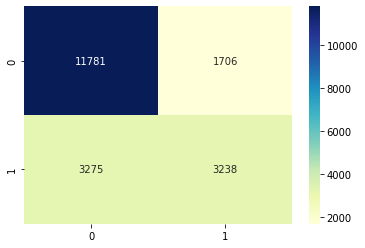

In [ ]:
cat_clf_def.fit(X_train, y_train)
y_pred_stack = cat_clf_def.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5006:	learn: 0.1006965	total: 10m 27s	remaining: 10m 25s
5007:	learn: 0.1006463	total: 10m 27s	remaining: 10m 25s
5008:	learn: 0.1006245	total: 10m 27s	remaining: 10m 25s
5009:	learn: 0.1006008	total: 10m 27s	remaining: 10m 24s
5010:	learn: 0.1005714	total: 10m 27s	remaining: 10m 24s
5011:	learn: 0.1005496	total: 10m 27s	remaining: 10m 24s
5012:	learn: 0.1005063	total: 10m 27s	remaining: 10m 24s
5013:	learn: 0.1004872	total: 10m 27s	remaining: 10m 24s
5014:	learn: 0.1004572	total: 10m 28s	remaining: 10m 24s
5015:	learn: 0.1004227	total: 10m 28s	remaining: 10m 24s
5016:	learn: 0.1003950	total: 10m 28s	remaining: 10m 24s
5017:	learn: 0.1003648	total: 10m 28s	remaining: 10m 23s
5018:	learn: 0.1003504	total: 10m 28s	remaining: 10m 23s
5019:	learn: 0.1002976	total: 10m 28s	remaining: 10m 23s
5020:	learn: 0.1002771	total: 10m 28s	remaining: 10m 23s
5021:	learn: 0.1002614	total: 10m 28s	remaining: 10m 23s
5022:	learn: 0.1002405	total: 10m 29s	remaining: 10m

{'AUC': 0.6826355729717538,
 'F1': 0.5614126652748782,
 '재현율recall': 0.49547059726700443,
 '정밀도precision': 0.647601846277343,
 '정확도accuracy': 0.7479}

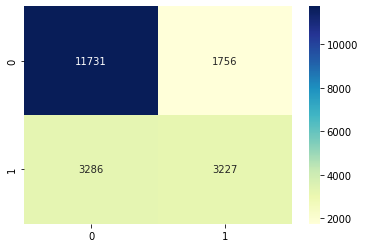

In [ ]:
cat_clf_def.fit(X_train, y_train)
y_pred_stack = cat_clf_def.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

0:	learn: 0.6900403	total: 119ms	remaining: 1m 59s
1:	learn: 0.6871584	total: 230ms	remaining: 1m 54s
2:	learn: 0.6845580	total: 346ms	remaining: 1m 54s
3:	learn: 0.6821154	total: 454ms	remaining: 1m 52s
4:	learn: 0.6793896	total: 575ms	remaining: 1m 54s
5:	learn: 0.6765924	total: 686ms	remaining: 1m 53s
6:	learn: 0.6740161	total: 798ms	remaining: 1m 53s
7:	learn: 0.6714215	total: 907ms	remaining: 1m 52s
8:	learn: 0.6690240	total: 1.02s	remaining: 1m 52s
9:	learn: 0.6666218	total: 1.16s	remaining: 1m 55s
10:	learn: 0.6642197	total: 1.28s	remaining: 1m 55s
11:	learn: 0.6620116	total: 1.39s	remaining: 1m 54s
12:	learn: 0.6597015	total: 1.5s	remaining: 1m 54s
13:	learn: 0.6574049	total: 1.61s	remaining: 1m 53s
14:	learn: 0.6552460	total: 1.73s	remaining: 1m 53s
15:	learn: 0.6530226	total: 1.84s	remaining: 1m 53s
16:	learn: 0.6508903	total: 1.95s	remaining: 1m 52s
17:	learn: 0.6487608	total: 2.06s	remaining: 1m 52s
18:	learn: 0.6465567	total: 2.19s	remaining: 1m 52s
19:	learn: 0.6445995	to

{'AUC': 0.67279244546309,
 'F1': 0.5394529439035698,
 '재현율recall': 0.4466451711960694,
 '정밀도precision': 0.6809456928838952,
 '정확도accuracy': 0.75165}

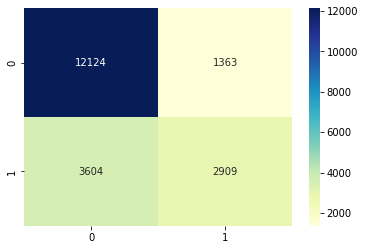

In [ ]:
cat_clf_fold2.fit(X_train, y_train)
y_pred_stack = cat_clf_fold2.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

0:	learn: 0.6901565	total: 121ms	remaining: 2m
1:	learn: 0.6872407	total: 238ms	remaining: 1m 58s
2:	learn: 0.6846260	total: 364ms	remaining: 2m
3:	learn: 0.6821850	total: 477ms	remaining: 1m 58s
4:	learn: 0.6794593	total: 596ms	remaining: 1m 58s
5:	learn: 0.6766624	total: 731ms	remaining: 2m 1s
6:	learn: 0.6740483	total: 855ms	remaining: 2m 1s
7:	learn: 0.6716573	total: 979ms	remaining: 2m 1s
8:	learn: 0.6692604	total: 1.11s	remaining: 2m 2s
9:	learn: 0.6668580	total: 1.23s	remaining: 2m 1s
10:	learn: 0.6644534	total: 1.35s	remaining: 2m 1s
11:	learn: 0.6622801	total: 1.46s	remaining: 2m
12:	learn: 0.6599636	total: 1.58s	remaining: 2m
13:	learn: 0.6577538	total: 1.71s	remaining: 2m
14:	learn: 0.6555920	total: 1.84s	remaining: 2m 1s
15:	learn: 0.6533624	total: 1.96s	remaining: 2m
16:	learn: 0.6512273	total: 2.08s	remaining: 2m
17:	learn: 0.6492808	total: 2.2s	remaining: 1m 59s
18:	learn: 0.6470713	total: 2.32s	remaining: 1m 59s
19:	learn: 0.6451074	total: 2.44s	remaining: 1m 59s
20:	le

{'AUC': 0.6732159899534649,
 'F1': 0.5402149740548554,
 '재현율recall': 0.447566405650238,
 '정밀도precision': 0.6812339331619537,
 '정확도accuracy': 0.7519}

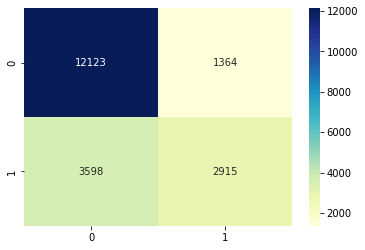

In [ ]:
cat_clf_fold2.fit(X_train, y_train)
y_pred_stack = cat_clf_fold2.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
cat_clf_onehot3 = CatBoostClassifier(depth= 10, iterations = 100, learning_rate= 0.04, fold_len_multiplier=2, one_hot_max_size = 3)
cat_clf_onehot40 = CatBoostClassifier(depth= 10, iterations = 100, learning_rate= 0.04, fold_len_multiplier=2, one_hot_max_size = 40)

0:	learn: 0.6809620	total: 108ms	remaining: 10.7s
1:	learn: 0.6702197	total: 211ms	remaining: 10.3s
2:	learn: 0.6612387	total: 333ms	remaining: 10.8s
3:	learn: 0.6533701	total: 432ms	remaining: 10.4s
4:	learn: 0.6446230	total: 535ms	remaining: 10.2s
5:	learn: 0.6364233	total: 643ms	remaining: 10.1s
6:	learn: 0.6291204	total: 754ms	remaining: 10s
7:	learn: 0.6226063	total: 855ms	remaining: 9.83s
8:	learn: 0.6166599	total: 959ms	remaining: 9.69s
9:	learn: 0.6109319	total: 1.06s	remaining: 9.59s
10:	learn: 0.6058932	total: 1.17s	remaining: 9.48s
11:	learn: 0.6010396	total: 1.27s	remaining: 9.33s
12:	learn: 0.5965466	total: 1.4s	remaining: 9.34s
13:	learn: 0.5922979	total: 1.5s	remaining: 9.21s
14:	learn: 0.5884371	total: 1.6s	remaining: 9.09s
15:	learn: 0.5850257	total: 1.71s	remaining: 8.97s
16:	learn: 0.5814129	total: 1.81s	remaining: 8.86s
17:	learn: 0.5779420	total: 1.92s	remaining: 8.77s
18:	learn: 0.5746652	total: 2.03s	remaining: 8.66s
19:	learn: 0.5717566	total: 2.13s	remaining: 8

{'AUC': 0.6534593690262334,
 'F1': 0.5003904724716908,
 '재현율recall': 0.39352065100568095,
 '정밀도precision': 0.686947199142321,
 '정확도accuracy': 0.7441}

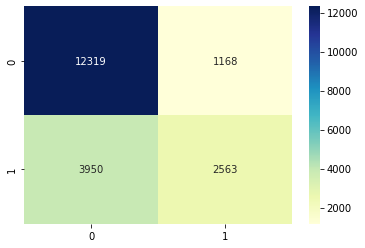

In [ ]:
cat_clf_onehot3.fit(X_train, y_train)
y_pred_stack = cat_clf_onehot3.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

0:	learn: 0.6809620	total: 116ms	remaining: 11.4s
1:	learn: 0.6702197	total: 231ms	remaining: 11.3s
2:	learn: 0.6612387	total: 349ms	remaining: 11.3s
3:	learn: 0.6533701	total: 451ms	remaining: 10.8s
4:	learn: 0.6446230	total: 556ms	remaining: 10.6s
5:	learn: 0.6364233	total: 669ms	remaining: 10.5s
6:	learn: 0.6291204	total: 780ms	remaining: 10.4s
7:	learn: 0.6226063	total: 890ms	remaining: 10.2s
8:	learn: 0.6166599	total: 999ms	remaining: 10.1s
9:	learn: 0.6109319	total: 1.11s	remaining: 9.97s
10:	learn: 0.6058932	total: 1.23s	remaining: 9.92s
11:	learn: 0.6010396	total: 1.33s	remaining: 9.76s
12:	learn: 0.5965466	total: 1.44s	remaining: 9.63s
13:	learn: 0.5922979	total: 1.54s	remaining: 9.49s
14:	learn: 0.5884371	total: 1.66s	remaining: 9.4s
15:	learn: 0.5850257	total: 1.77s	remaining: 9.29s
16:	learn: 0.5814129	total: 1.88s	remaining: 9.16s
17:	learn: 0.5779420	total: 1.98s	remaining: 9.02s
18:	learn: 0.5746652	total: 2.09s	remaining: 8.93s
19:	learn: 0.5717566	total: 2.22s	remainin

{'AUC': 0.6534593690262334,
 'F1': 0.5003904724716908,
 '재현율recall': 0.39352065100568095,
 '정밀도precision': 0.686947199142321,
 '정확도accuracy': 0.7441}

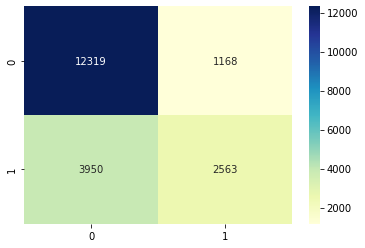

In [ ]:
cat_clf_onehot40.fit(X_train, y_train)
y_pred_stack = cat_clf_onehot40.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

## xgb stack

### xgb opt

## rnd stack

# test

##cat test

0:	learn: 0.6827764	total: 30.7ms	remaining: 2m 2s
1:	learn: 0.6735712	total: 60.6ms	remaining: 2m 1s
2:	learn: 0.6648824	total: 100ms	remaining: 2m 13s
3:	learn: 0.6570274	total: 151ms	remaining: 2m 30s
4:	learn: 0.6498228	total: 201ms	remaining: 2m 40s
5:	learn: 0.6425949	total: 268ms	remaining: 2m 58s
6:	learn: 0.6362437	total: 336ms	remaining: 3m 11s
7:	learn: 0.6307655	total: 411ms	remaining: 3m 24s
8:	learn: 0.6254612	total: 449ms	remaining: 3m 19s
9:	learn: 0.6207153	total: 512ms	remaining: 3m 24s
10:	learn: 0.6163506	total: 570ms	remaining: 3m 26s
11:	learn: 0.6120908	total: 637ms	remaining: 3m 31s
12:	learn: 0.6076744	total: 678ms	remaining: 3m 27s
13:	learn: 0.6041871	total: 721ms	remaining: 3m 25s
14:	learn: 0.6008224	total: 786ms	remaining: 3m 28s
15:	learn: 0.5977539	total: 827ms	remaining: 3m 25s
16:	learn: 0.5950758	total: 857ms	remaining: 3m 20s
17:	learn: 0.5922570	total: 887ms	remaining: 3m 16s
18:	learn: 0.5894152	total: 939ms	remaining: 3m 16s
19:	learn: 0.5868178	t

{'AUC': 0.69238948036902,
 'F1': 0.5763894948084809,
 '재현율recall': 0.5046600458365165,
 '정밀도precision': 0.6718877135882831,
 '정확도accuracy': 0.75725}

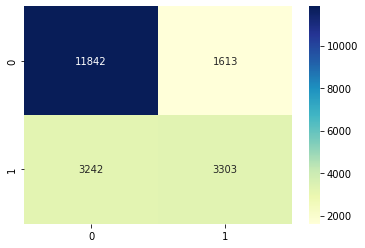

In [ ]:
cat_clf_def54.fit(X_train, y_train)
y_pred_stack = cat_clf_def54.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6:	learn: 0.6362437	total: 171ms	remaining: 2m 2s
7:	learn: 0.6307655	total: 194ms	remaining: 2m 1s
8:	learn: 0.6254612	total: 216ms	remaining: 2m
9:	learn: 0.6207153	total: 242ms	remaining: 2m
10:	learn: 0.6163506	total: 265ms	remaining: 2m
11:	learn: 0.6120908	total: 286ms	remaining: 1m 58s
12:	learn: 0.6076744	total: 309ms	remaining: 1m 58s
13:	learn: 0.6041871	total: 336ms	remaining: 1m 59s
14:	learn: 0.6008224	total: 359ms	remaining: 1m 59s
15:	learn: 0.5977539	total: 382ms	remaining: 1m 58s
16:	learn: 0.5950758	total: 403ms	remaining: 1m 58s
17:	learn: 0.5922570	total: 424ms	remaining: 1m 57s
18:	learn: 0.5894152	total: 451ms	remaining: 1m 58s
19:	learn: 0.5868178	total: 477ms	remaining: 1m 58s
20:	learn: 0.5846981	total: 499ms	remaining: 1m 58s
21:	learn: 0.5829342	total: 521ms	remaining: 1m 57s
22:	learn: 0.5811608	total: 543ms	remaining: 1m 57s
23:	learn: 0.5792870	total: 573ms	remaining: 1m 58s
24:	learn: 0.5778811	total: 596ms	remaining: 1

{'AUC': 0.6939277261527901,
 'F1': 0.5789839944328462,
 '재현율recall': 0.508479755538579,
 '정밀도precision': 0.6721874368814381,
 '정확도accuracy': 0.758}

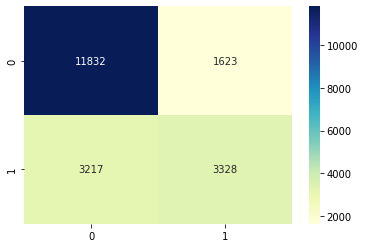

In [ ]:
cat_clf_def55.fit(X_train, y_train)
y_pred_stack = cat_clf_def55.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

0:	learn: 0.6825765	total: 28.5ms	remaining: 1m 54s
1:	learn: 0.6733212	total: 55ms	remaining: 1m 50s
2:	learn: 0.6647898	total: 81.3ms	remaining: 1m 48s
3:	learn: 0.6564259	total: 108ms	remaining: 1m 47s
4:	learn: 0.6482501	total: 137ms	remaining: 1m 49s
5:	learn: 0.6416921	total: 164ms	remaining: 1m 49s
6:	learn: 0.6347793	total: 190ms	remaining: 1m 48s
7:	learn: 0.6282528	total: 217ms	remaining: 1m 48s
8:	learn: 0.6226127	total: 250ms	remaining: 1m 51s
9:	learn: 0.6175227	total: 281ms	remaining: 1m 52s
10:	learn: 0.6128505	total: 315ms	remaining: 1m 54s
11:	learn: 0.6083556	total: 342ms	remaining: 1m 53s
12:	learn: 0.6046226	total: 375ms	remaining: 1m 54s
13:	learn: 0.6008159	total: 402ms	remaining: 1m 54s
14:	learn: 0.5971627	total: 429ms	remaining: 1m 53s
15:	learn: 0.5941814	total: 460ms	remaining: 1m 54s
16:	learn: 0.5913786	total: 487ms	remaining: 1m 54s
17:	learn: 0.5888479	total: 518ms	remaining: 1m 54s
18:	learn: 0.5862072	total: 545ms	remaining: 1m 54s
19:	learn: 0.5837008	

{'AUC': 0.6932650469734868,
 'F1': 0.5781480517226417,
 '재현율recall': 0.5089381207028266,
 '정밀도precision': 0.6691442346323825,
 '정확도accuracy': 0.75695}

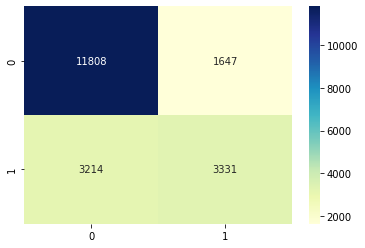

In [ ]:
cat_clf_def64.fit(X_train, y_train)
y_pred_stack = cat_clf_def64.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1006:	learn: 0.4649535	total: 41.7s	remaining: 3m 26s
1007:	learn: 0.4649158	total: 41.7s	remaining: 3m 26s
1008:	learn: 0.4648863	total: 41.7s	remaining: 3m 26s
1009:	learn: 0.4648278	total: 41.7s	remaining: 3m 26s
1010:	learn: 0.4647789	total: 41.8s	remaining: 3m 26s
1011:	learn: 0.4647057	total: 41.8s	remaining: 3m 25s
1012:	learn: 0.4646726	total: 41.8s	remaining: 3m 25s
1013:	learn: 0.4646314	total: 41.8s	remaining: 3m 25s
1014:	learn: 0.4646042	total: 41.9s	remaining: 3m 25s
1015:	learn: 0.4645427	total: 41.9s	remaining: 3m 25s
1016:	learn: 0.4644988	total: 41.9s	remaining: 3m 25s
1017:	learn: 0.4644647	total: 41.9s	remaining: 3m 25s
1018:	learn: 0.4644276	total: 42s	remaining: 3m 25s
1019:	learn: 0.4643885	total: 42s	remaining: 3m 25s
1020:	learn: 0.4643659	total: 42s	remaining: 3m 24s
1021:	learn: 0.4643345	total: 42s	remaining: 3m 24s
1022:	learn: 0.4642970	total: 42.1s	remaining: 3m 24s
1023:	learn: 0.4642541	total: 42.1s	remaining: 3m 24s


{'AUC': 0.6916071708910583,
 'F1': 0.5756892665163863,
 '재현율recall': 0.5072574484339191,
 '정밀도precision': 0.6654640208458609,
 '정확도accuracy': 0.7553}

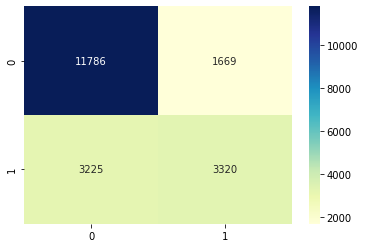

In [ ]:
cat_clf_def65.fit(X_train, y_train)
y_pred_stack = cat_clf_def65.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1006:	learn: 0.4575381	total: 23.7s	remaining: 1m 57s
1007:	learn: 0.4574800	total: 23.7s	remaining: 1m 57s
1008:	learn: 0.4574352	total: 23.8s	remaining: 1m 57s
1009:	learn: 0.4574328	total: 23.8s	remaining: 1m 57s
1010:	learn: 0.4574046	total: 23.8s	remaining: 1m 57s
1011:	learn: 0.4573558	total: 23.8s	remaining: 1m 57s
1012:	learn: 0.4573193	total: 23.8s	remaining: 1m 57s
1013:	learn: 0.4572838	total: 23.9s	remaining: 1m 57s
1014:	learn: 0.4572617	total: 23.9s	remaining: 1m 57s
1015:	learn: 0.4571983	total: 23.9s	remaining: 1m 57s
1016:	learn: 0.4571683	total: 23.9s	remaining: 1m 57s
1017:	learn: 0.4571129	total: 24s	remaining: 1m 57s
1018:	learn: 0.4570732	total: 24s	remaining: 1m 57s
1019:	learn: 0.4570204	total: 24s	remaining: 1m 57s
1020:	learn: 0.4569759	total: 24s	remaining: 1m 57s
1021:	learn: 0.4569467	total: 24s	remaining: 1m 57s
1022:	learn: 0.4569058	total: 24.1s	remaining: 1m 57s
1023:	learn: 0.4568320	total: 24.1s	remaining: 1m 57s
10

{'AUC': 0.6969095979326159,
 'F1': 0.5848073143638385,
 '재현율recall': 0.5228418640183347,
 '정밀도precision': 0.6634354400930593,
 '정확도accuracy': 0.75705}

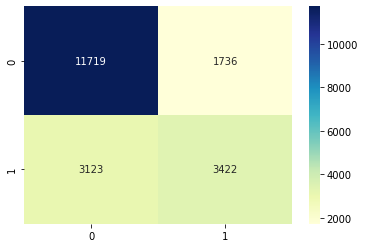

In [ ]:
stacking_cat_clf.fit(X_train, y_train)
y_pred_stack = stacking_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1006:	learn: 0.4649535	total: 27.8s	remaining: 2m 18s
1007:	learn: 0.4649158	total: 27.9s	remaining: 2m 18s
1008:	learn: 0.4648863	total: 27.9s	remaining: 2m 17s
1009:	learn: 0.4648278	total: 27.9s	remaining: 2m 17s
1010:	learn: 0.4647789	total: 28s	remaining: 2m 17s
1011:	learn: 0.4647057	total: 28s	remaining: 2m 17s
1012:	learn: 0.4646726	total: 28s	remaining: 2m 17s
1013:	learn: 0.4646314	total: 28s	remaining: 2m 17s
1014:	learn: 0.4646042	total: 28.1s	remaining: 2m 17s
1015:	learn: 0.4645427	total: 28.1s	remaining: 2m 17s
1016:	learn: 0.4644988	total: 28.1s	remaining: 2m 17s
1017:	learn: 0.4644647	total: 28.1s	remaining: 2m 17s
1018:	learn: 0.4644276	total: 28.2s	remaining: 2m 17s
1019:	learn: 0.4643885	total: 28.2s	remaining: 2m 17s
1020:	learn: 0.4643659	total: 28.2s	remaining: 2m 17s
1021:	learn: 0.4643345	total: 28.3s	remaining: 2m 17s
1022:	learn: 0.4642970	total: 28.3s	remaining: 2m 17s
1023:	learn: 0.4642541	total: 28.3s	remaining: 2m 17s


{'AUC': 0.6935478275631728,
 'F1': 0.5783887245519401,
 '재현율recall': 0.5078686019862491,
 '정밀도precision': 0.671650838553243,
 '정확도accuracy': 0.7577}

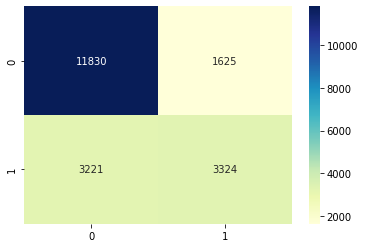

In [ ]:
voting_cat_clf.fit(X_train, y_train)
y_pred_stack = voting_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

Learning rate set to 0.06692
0:	learn: 0.6757309	total: 28.3ms	remaining: 28.3s
1:	learn: 0.6614392	total: 55.9ms	remaining: 27.9s
2:	learn: 0.6489071	total: 91.7ms	remaining: 30.5s
3:	learn: 0.6369226	total: 120ms	remaining: 30s
4:	learn: 0.6260691	total: 148ms	remaining: 29.4s
5:	learn: 0.6178663	total: 178ms	remaining: 29.5s
6:	learn: 0.6099387	total: 218ms	remaining: 30.9s
7:	learn: 0.6025870	total: 246ms	remaining: 30.5s
8:	learn: 0.5971268	total: 273ms	remaining: 30.1s
9:	learn: 0.5917062	total: 300ms	remaining: 29.7s
10:	learn: 0.5868719	total: 326ms	remaining: 29.3s
11:	learn: 0.5824044	total: 358ms	remaining: 29.5s
12:	learn: 0.5788295	total: 388ms	remaining: 29.5s
13:	learn: 0.5753608	total: 415ms	remaining: 29.3s
14:	learn: 0.5724521	total: 444ms	remaining: 29.1s
15:	learn: 0.5701259	total: 473ms	remaining: 29.1s
16:	learn: 0.5675661	total: 499ms	remaining: 28.8s
17:	learn: 0.5655369	total: 526ms	remaining: 28.7s
18:	learn: 0.5632026	total: 553ms	remaining: 28.6s
19:	learn: 

{'AUC': 0.689639147439659,
 'F1': 0.5715039577836412,
 '재현율recall': 0.4964094728800611,
 '정밀도precision': 0.6733678756476684,
 '정확도accuracy': 0.7564}

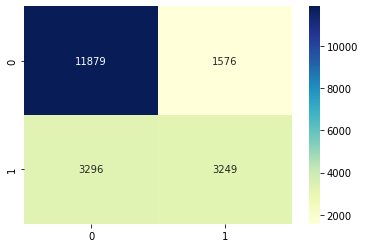

In [ ]:
cat_clf.fit(X_train, y_train)
y_pred_stack = cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
cat_clf_def54 = CatBoostClassifier(depth= 5, iterations = 4000, learning_rate= 0.04  )
cat_clf_def55 = CatBoostClassifier(depth= 5, iterations = 5000, learning_rate= 0.04 )
# cat_clf_def64 = CatBoostClassifier(depth= 6, iterations = 4000, learning_rate= 0.04 )
# cat_clf_def65 = CatBoostClassifier(depth= 6, iterations = 6000, learning_rate= 0.04 )
stacking_cat_clf = StackingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55), 
                                                #   ('64', cat_clf_def64), ('65', cat_clf_def65)
                                                  ], final_estimator = LGBMClassifier())
voting_cat_clf = VotingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55),
                                            #   ('64', cat_clf_def64), ('65', cat_clf_def65)
                                              ], voting='soft')

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6:	learn: 0.6362437	total: 164ms	remaining: 1m 56s
7:	learn: 0.6307655	total: 187ms	remaining: 1m 56s
8:	learn: 0.6254612	total: 209ms	remaining: 1m 55s
9:	learn: 0.6207153	total: 241ms	remaining: 2m
10:	learn: 0.6163506	total: 267ms	remaining: 2m 1s
11:	learn: 0.6120908	total: 289ms	remaining: 2m
12:	learn: 0.6076744	total: 316ms	remaining: 2m 1s
13:	learn: 0.6041871	total: 340ms	remaining: 2m
14:	learn: 0.6008224	total: 362ms	remaining: 2m
15:	learn: 0.5977539	total: 385ms	remaining: 1m 59s
16:	learn: 0.5950758	total: 407ms	remaining: 1m 59s
17:	learn: 0.5922570	total: 428ms	remaining: 1m 58s
18:	learn: 0.5894152	total: 461ms	remaining: 2m
19:	learn: 0.5868178	total: 482ms	remaining: 2m
20:	learn: 0.5846981	total: 505ms	remaining: 1m 59s
21:	learn: 0.5829342	total: 527ms	remaining: 1m 59s
22:	learn: 0.5811608	total: 556ms	remaining: 2m
23:	learn: 0.5792870	total: 580ms	remaining: 2m
24:	learn: 0.5778811	total: 603ms	remaining: 1m 59s
25:	learn: 0.5

{'AUC': 0.6924328584175132,
 'F1': 0.5765105937745226,
 '재현율recall': 0.5051184110007639,
 '정밀도precision': 0.6714053614947197,
 '정확도accuracy': 0.75715}

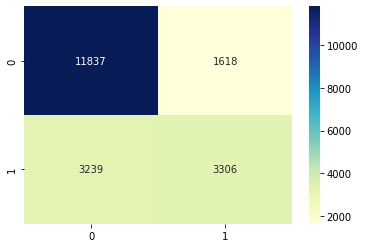

In [ ]:
# 54 55 vote
voting_cat_clf.fit(X_train, y_train)
y_pred_stack = voting_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6:	learn: 0.6368848	total: 150ms	remaining: 1m 46s
7:	learn: 0.6312528	total: 169ms	remaining: 1m 45s
8:	learn: 0.6260087	total: 187ms	remaining: 1m 43s
9:	learn: 0.6211422	total: 205ms	remaining: 1m 42s
10:	learn: 0.6162623	total: 234ms	remaining: 1m 46s
11:	learn: 0.6122536	total: 253ms	remaining: 1m 44s
12:	learn: 0.6078798	total: 272ms	remaining: 1m 44s
13:	learn: 0.6043297	total: 291ms	remaining: 1m 43s
14:	learn: 0.6007195	total: 310ms	remaining: 1m 43s
15:	learn: 0.5977385	total: 329ms	remaining: 1m 42s
16:	learn: 0.5947359	total: 349ms	remaining: 1m 42s
17:	learn: 0.5917636	total: 368ms	remaining: 1m 41s
18:	learn: 0.5895000	total: 387ms	remaining: 1m 41s
19:	learn: 0.5867670	total: 407ms	remaining: 1m 41s
20:	learn: 0.5849435	total: 426ms	remaining: 1m 40s
21:	learn: 0.5827868	total: 463ms	remaining: 1m 44s
22:	learn: 0.5807805	total: 484ms	remaining: 1m 44s
23:	learn: 0.5790594	total: 502ms	remaining: 1m 44s
24:	learn: 0.5774641	total: 521m

{'AUC': 0.691202403734373,
 'F1': 0.5748086290883785,
 '재현율recall': 0.5048128342245989,
 '정밀도precision': 0.6673399313270046,
 '정확도accuracy': 0.7556}

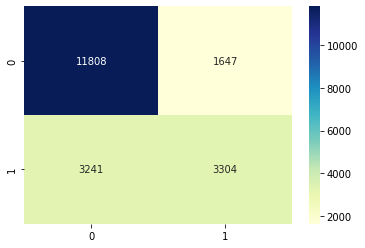

In [ ]:
# 54 55 stack
stacking_cat_clf.fit(X_train, y_train)
y_pred_stack = stacking_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [11]:
cat_clf_def54 = CatBoostClassifier(depth= 5, iterations = 4000, learning_rate= 0.04  )
cat_clf_def55 = CatBoostClassifier(depth= 5, iterations = 5000, learning_rate= 0.04 )
cat_clf_def64 = CatBoostClassifier(depth= 6, iterations = 4000, learning_rate= 0.04 )
cat_clf_def65 = CatBoostClassifier(depth= 6, iterations = 6000, learning_rate= 0.04 )
stacking_cat_clf = StackingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55), 
                                                  ('64', cat_clf_def64), ('65', cat_clf_def65)
                                                  ], final_estimator = LGBMClassifier())
voting_cat_clf = VotingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55),
                                              ('64', cat_clf_def64), ('65', cat_clf_def65)
                                              ], voting='soft')

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
1006:	learn: 0.4654594	total: 29.4s	remaining: 2m 25s
1007:	learn: 0.4654248	total: 29.4s	remaining: 2m 25s
1008:	learn: 0.4653813	total: 29.5s	remaining: 2m 25s
1009:	learn: 0.4653487	total: 29.5s	remaining: 2m 25s
1010:	learn: 0.4653306	total: 29.5s	remaining: 2m 25s
1011:	learn: 0.4652824	total: 29.5s	remaining: 2m 25s
1012:	learn: 0.4652406	total: 29.6s	remaining: 2m 25s
1013:	learn: 0.4651947	total: 29.6s	remaining: 2m 25s
1014:	learn: 0.4651564	total: 29.6s	remaining: 2m 25s
1015:	learn: 0.4651090	total: 29.6s	remaining: 2m 25s
1016:	learn: 0.4650654	total: 29.7s	remaining: 2m 25s
1017:	learn: 0.4650239	total: 29.7s	remaining: 2m 25s
1018:	learn: 0.4649767	total: 29.7s	remaining: 2m 25s
1019:	learn: 0.4649409	total: 29.8s	remaining: 2m 25s
1020:	learn: 0.4649018	total: 29.8s	remaining: 2m 25s
1021:	learn: 0.4648672	total: 29.8s	remaining: 2m 25s
1022:	learn: 0.4648073	total: 29.8s	remaining: 2m 25s
1023:	learn: 0.4647780	total: 29.9s	remaining:

{'AUC': 0.6920893196316037,
 'F1': 0.5720897116411534,
 '재현율recall': 0.5087858160519234,
 '정밀도precision': 0.6533848343159179,
 '정확도accuracy': 0.7596}

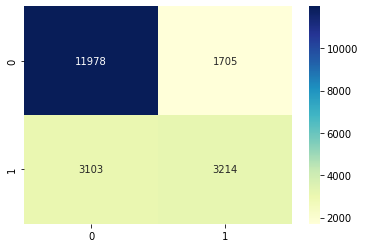

In [12]:
# 54 55 64 66 vote
voting_cat_clf.fit(X_train, y_train)
y_pred_stack = voting_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


In [13]:
# 54 55 64 66 stack
stacking_cat_clf.fit(X_train, y_train)
y_pred_stack = stacking_cat_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
2699:	learn: 0.4310031	total: 57.4s	remaining: 48.9s
2700:	learn: 0.4309824	total: 57.4s	remaining: 48.9s
2701:	learn: 0.4309670	total: 57.4s	remaining: 48.9s
2702:	learn: 0.4309517	total: 57.5s	remaining: 48.8s
2703:	learn: 0.4309193	total: 57.5s	remaining: 48.8s
2704:	learn: 0.4308945	total: 57.5s	remaining: 48.8s
2705:	learn: 0.4308676	total: 57.5s	remaining: 48.8s
2706:	learn: 0.4308567	total: 57.5s	remaining: 48.7s
2707:	learn: 0.4308338	total: 57.6s	remaining: 48.7s
2708:	learn: 0.4308195	total: 57.6s	remaining: 48.7s
2709:	learn: 0.4307994	total: 57.6s	remaining: 48.7s
2710:	learn: 0.4307756	total: 57.6s	remaining: 48.7s
2711:	learn: 0.4307419	total: 57.7s	remaining: 48.6s
2712:	learn: 0.4307256	total: 57.7s	remaining: 48.6s
2713:	learn: 0.4306953	total: 57.7s	remaining: 48.6s
2714:	learn: 0.4306723	total: 57.7s	remaining: 48.6s
2715:	learn: 0.4306551	total: 57.7s	remaining: 48.6s
2716:	learn: 0.4306385	total: 57.8s	remaining: 48.5s
2717:	lear

KeyboardInterrupt: ignored

In [ ]:
lgbm_clf.fit(X_train, y_train)
y_pred_stack = lgbm_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
voting_lgbm_clf.fit(X_train, y_train)
y_pred_stack = voting_lgbm_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
stacking_lgbm_clf.fit(X_train, y_train)
y_pred_stack = stacking_lgbm_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

#final stack

In [9]:
xgb_clf = xgboost.XGBClassifier()
xgb_clf_5_300 = xgboost.XGBClassifier(max_depth = 5,
                                n_estimators = 300,
                                eval_metric='mlogloss')
xgb_clf_9_260 = xgboost.XGBClassifier(max_depth = 9,
                                n_estimators = 260,
                                eval_metric='mlogloss')
stacking_xgb_clf = StackingClassifier(estimators=[('xgb_clf_5_300', xgb_clf_5_300), ('xgb_clf_9_260', xgb_clf_9_260)], final_estimator = LGBMClassifier())
voting_xgb_clf = VotingClassifier(estimators=[('xgb_clf_5_300', xgb_clf_5_300), ('xgb_clf_9_260', xgb_clf_9_260)], voting='soft')

lgbm_clf = LGBMClassifier()
lgbm_clf_gbdt = LGBMClassifier(boosting_type = 'gbdt')
lgbm_clf_rf_L1 =  LGBMClassifier(boosting_type="rf",
                         num_leaves=165,
                         colsample_bytree=.5,
                         n_estimators=400,
                         min_child_weight=5,
                         min_child_samples=10,
                         subsample=.632, # Standard RF bagging fraction
                         subsample_freq=1,
                         min_split_gain=0,
                         reg_alpha=10, # Hard L1 regularization
                         reg_lambda=0,
                         n_jobs=3)
lgbm_clf_dart = LGBMClassifier(boosting_type = 'dart')
lgbm_clf_goss = LGBMClassifier(boosting_type = 'goss')
stacking_lgbm_clf = StackingClassifier(estimators=[('gbdt', lgbm_clf_gbdt), ('rf1', lgbm_clf_rf_L1),  ('dart', lgbm_clf_dart),('goss',lgbm_clf_goss)], final_estimator = LGBMClassifier())
voting_lgbm_clf = VotingClassifier(estimators=[('gbdt', lgbm_clf_gbdt), ('rf1', lgbm_clf_rf_L1),  ('dart', lgbm_clf_dart),('goss',lgbm_clf_goss) ], voting='soft')

cat_clf= CatBoostClassifier()
cat_clf_def54 = CatBoostClassifier(depth= 5, iterations = 4000, learning_rate= 0.04  )
cat_clf_def55 = CatBoostClassifier(depth= 5, iterations = 5000, learning_rate= 0.04 )
voting_cat_clf = VotingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55) ], voting='soft')
stacking_cat_clf = StackingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55) ], final_estimator = LGBMClassifier())



rnd_clf = RandomForestClassifier()
dtc_clf = DecisionTreeClassifier()
ada_clf = AdaBoostClassifier()
gbc_clf = GradientBoostingClassifier()
bag_clf = BaggingClassifier()
ext_clf = ExtraTreesClassifier()
knn_clf = KNeighborsClassifier()
# svm_clf = SVC()
# rid_clf = RidgeClassifier()
stacking_ext_clf = StackingClassifier(estimators=[('rnd', rnd_clf),   ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf) ], final_estimator = LGBMClassifier())
voting_ext_clf = VotingClassifier(estimators=[('rnd', rnd_clf),   ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf) ], voting='soft')
# tabnet_clf = TabNetClassifier()


In [ ]:
stacking_clf = StackingClassifier(estimators=[('stacking_ext_clf', stacking_ext_clf),   ('voting_ext_clf', voting_ext_clf),  
                                              ('stacking_xgb_clf', stacking_xgb_clf), ('voting_xgb_clf', voting_xgb_clf),
                                              ('lgbmstack', stacking_lgbm_clf), ('lgbmvote', voting_lgbm_clf),
                                              ('catstack', stacking_cat_clf), ('catvote', voting_cat_clf)
                                              
                                              ], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6827817	total: 27.2ms	remaining: 2m 15s
1:	learn: 0.6732218	total: 48.3ms	remaining: 2m
2:	learn: 0.6649289	total: 69.3ms	remaining: 1m 55s
3:	learn: 0.6568151	total: 90.9ms	remaining: 1m 53s
4:	learn: 0.6493802	total: 111ms	remaining: 1m 50s
5:	learn: 0.6429223	total: 131ms	remaining: 1m 48s
6:	learn: 0.6362563	total: 153ms	remaining: 1m 49s
7:	learn: 0.6301803	total: 175ms	remaining: 1m 49s
8:	learn: 0.6249490	total: 196ms	remaining: 1m 48s
9:	learn: 0.6208059	total: 217ms	remaining: 1m 48s
10:	learn: 0.6161039	total: 246ms	remaining: 1m 51s
11:	learn: 0.6120469	total: 269ms	remaining: 1m 51s
12:	learn: 0.6082690	total: 291ms	remaining: 1m 51s
13:	learn: 0.6047485	total: 311ms	remaining: 1m 50s
14:	learn: 0.6012972	total: 332ms	remaining: 1m 50s
15:	learn: 0.5981448	total: 354ms	remaining: 1m 50s
16:	learn: 0.5950774	total: 375ms	remaining: 1m 49s
17:	learn: 0.5926062	total: 411ms	remaining: 1m 53s
18:	learn: 0.5899941	to

In [ ]:
y_pred_prob = stacking_clf.predict_proba(X_valid)
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)


In [ ]:
t = []
for probnum in [x/1000 for x in range(300,510,5)]:
    print(probnum)
    r = get_clf_eval(y_valid, y_pred_prob[:,1]>probnum)
    t.append((probnum, r))

print(t)

In [ ]:
# folder = '/content/drive/MyDrive/Colab Notebooks/ML study/day27 220126'

for probnum in [x/1000 for x in range(300,510,5)]:

    # 제출 양식 다운로드
    submit = pd.read_csv(os.path.join(folder, 'sample_submission.csv'))

    # prediction 수행
    df_test = pd.read_csv(os.path.join(folder, 'test.csv'))
    submit['answer'] = stacking_clf.predict_proba(df_test.drop(columns=['ID']))[:,1]>probnum
    submit["answer"] = submit["answer"].astype(int)
    filename = 'predictionext' + str(probnum) + '.csv'
    # 제출 파일 저장
    submit.to_csv(os.path.join(folder, filename), index=False)

In [ ]:
 StackingClassifier(estimators=[('stacking_ext_clf', stacking_ext_clf),   ('voting_ext_clf', voting_ext_clf),  
                                              ('stacking_xgb_clf', stacking_xgb_clf), ('voting_xgb_clf', voting_xgb_clf),
                                              ('lgbmstack', stacking_lgbm_clf), ('lgbmvote', voting_lgbm_clf),
                                              ('catstack', stacking_cat_clf), ('catvote', voting_cat_clf)
                                              
                                              ], final_estimator = LGBMClassifier())
stacking_clf.predict_proba(df_test.drop(columns=['ID']))[:,1]>0.38

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
6:	learn: 0.6369372	total: 141ms	remaining: 1m 40s
7:	learn: 0.6314924	total: 159ms	remaining: 1m 39s
8:	learn: 0.6255636	total: 179ms	remaining: 1m 39s
9:	learn: 0.6211275	total: 199ms	remaining: 1m 39s
10:	learn: 0.6167670	total: 222ms	remaining: 1m 40s
11:	learn: 0.6126352	total: 250ms	remaining: 1m 43s
12:	learn: 0.6088754	total: 269ms	remaining: 1m 43s
13:	learn: 0.6049474	total: 288ms	remaining: 1m 42s
14:	learn: 0.6016904	total: 307ms	remaining: 1m 42s
15:	learn: 0.5985502	total: 344ms	remaining: 1m 47s
16:	learn: 0.5957232	total: 364ms	remaining: 1m 46s
17:	learn: 0.5929463	total: 381ms	remaining: 1m 45s
18:	learn: 0.5903522	total: 404ms	remaining: 1m 45s
19:	learn: 0.5877688	total: 427ms	remaining: 1m 46s
20:	learn: 0.5856371	total: 452ms	remaining: 1m 47s
21:	learn: 0.5837518	total: 471ms	remaining: 1m 46s
22:	learn: 0.5820854	total: 491ms	remaining: 1m 46s
23:	learn: 0.5799941	total: 511ms	remaining: 1m 45s
24:	learn: 0.5781064	total: 531m

{'AUC': 0.6953445805576527,
 'F1': 0.5821492384922998,
 '재현율recall': 0.5267128560431101,
 '정밀도precision': 0.6506276150627615,
 '정확도accuracy': 0.75445}

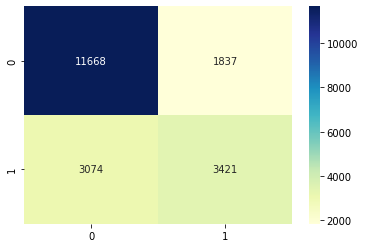

In [15]:
stacking_clf = StackingClassifier(estimators=[('rnd', rnd_clf),   ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf),
                                              ('stacking_xgb_clf', stacking_xgb_clf), ('voting_xgb_clf', voting_xgb_clf),
                                              ('lgbmstack', stacking_lgbm_clf), ('lgbmvote', voting_lgbm_clf),
                                              ('catstack', stacking_cat_clf), ('catvote', voting_cat_clf)
                                              
                                              ], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)


정확도accuracy: 0.7366
정밀도precision: 0.5819
재현율recall: 0.6708
AUC: 0.7195
F1: 0.6232


{'AUC': 0.7194918256546274,
 'F1': 0.623185296431381,
 '재현율recall': 0.6708237105465743,
 '정밀도precision': 0.5818643162393162,
 '정확도accuracy': 0.73655}

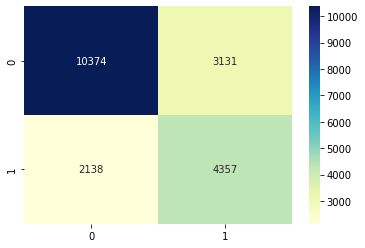

In [16]:
y_pred_prob = stacking_clf.predict_proba(X_valid)
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)


0.3

정확도accuracy: 0.7086
정밀도precision: 0.5352
재현율recall: 0.7800
AUC: 0.7271
F1: 0.6348
0.305

정확도accuracy: 0.7107
정밀도precision: 0.5379
재현율recall: 0.7754
AUC: 0.7275
F1: 0.6351
0.31

정확도accuracy: 0.7121
정밀도precision: 0.5398
재현율recall: 0.7714
AUC: 0.7275
F1: 0.6351
0.315

정확도accuracy: 0.7138
정밀도precision: 0.5420
재현율recall: 0.7667
AUC: 0.7275
F1: 0.6350
0.32

정확도accuracy: 0.7158
정밀도precision: 0.5446
재현율recall: 0.7626
AUC: 0.7279
F1: 0.6354
0.325

정확도accuracy: 0.7167
정밀도precision: 0.5461
재현율recall: 0.7574
AUC: 0.7273
F1: 0.6346
0.33

정확도accuracy: 0.7184
정밀도precision: 0.5483
재현율recall: 0.7530
AUC: 0.7274
F1: 0.6346
0.335

정확도accuracy: 0.7189
정밀도precision: 0.5495
재현율recall: 0.7466
AUC: 0.7261
F1: 0.6331
0.34

정확도accuracy: 0.7210
정밀도precision: 0.5525
재현율recall: 0.7420
AUC: 0.7265
F1: 0.6334
0.345

정확도accuracy: 0.7226
정밀도precision: 0.5548
재현율recall: 0.7369
AUC: 0.7263
F1: 0.6330
0.35

정확도accuracy: 0.7242
정밀도precision: 0.5575
재현율recall: 0.7310
AUC: 0.7260
F1: 0.6326
0.355

정확도accuracy: 0.7262
정

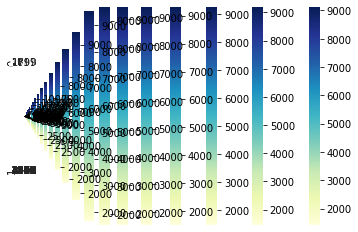

In [17]:
t = []
for probnum in [x/1000 for x in range(300,510,5)]:
    print(probnum)
    r = get_clf_eval(y_valid, y_pred_prob[:,1]>probnum)
    t.append((probnum, r))

print(t)

In [ ]:
[(0.3, {'정확도accuracy': 0.7086, '정밀도precision': 0.5352350765979926, '재현율recall': 0.7799846035411855, 'AUC': 0.727126696439234, 'F1': 0.6348370927318295}),
 (0.305, {'정확도accuracy': 0.7107, '정밀도precision': 0.5378617964327673, '재현율recall': 0.7753656658968437, 'AUC': 0.7274829069950712, 'F1': 0.6351368394501199}),
 (0.31, {'정확도accuracy': 0.71215, '정밀도precision': 0.539754363283775, '재현율recall': 0.7713625866050808, 'AUC': 0.7275176502073905, 'F1': 0.6351017303669899})
 , (0.315, {'정확도accuracy': 0.7138, '정밀도precision': 0.5419523343127652, '재현율recall': 0.766743648960739, 'AUC': 0.7275406508409766, 'F1': 0.6350420811017597}),
 (0.32, {'정확도accuracy': 0.7158, '정밀도precision': 0.5445849367784497, '재현율recall': 0.7625866050808314, 'AUC': 0.7279426916555582, 'F1': 0.6354073123797306}),
 (0.325, {'정확도accuracy': 0.71675, '정밀도precision': 0.5460701598579041, '재현율recall': 0.7573518090839108, 'AUC': 0.7272875298659095, 'F1': 0.6345868541572598}), 
 (0.33, {'정확도accuracy': 0.71835, '정밀도precision': 0.5483183856502242, '재현율recall': 0.7530408006158583, 'AUC': 0.7273534251135567, 'F1': 0.6345767109957833}), 
 (0.335, {'정확도accuracy': 0.71895, '정밀도precision': 0.5495240253853128, '재현율recall': 0.7465742879137798, 'AUC': 0.7261194282960236, 'F1': 0.6330700437365363}),
 (0.34, {'정확도accuracy': 0.72105, '정밀도precision': 0.5525108919972483, '재현율recall': 0.741955350269438, 'AUC': 0.7264756388518608, 'F1': 0.633370572386147}),
 (0.345, {'정확도accuracy': 0.72255, '정밀도precision': 0.5548342221191745, '재현율recall': 0.736874518860662, 'AUC': 0.72626769260323, 'F1': 0.6330269162092454}), 
 (0.35, {'정확도accuracy': 0.72425, '정밀도precision': 0.5575387505871301, '재현율recall': 0.7310238645111624, 'AUC': 0.7260080448064883, 'F1': 0.6326027579774831}), 
 (0.355, {'정확도accuracy': 0.72625, '정밀도precision': 0.5605413105413105, '재현율recall': 0.7270207852193995, 'AUC': 0.7264500445904476, 'F1': 0.6330182988135934}),
 (0.36, {'정확도accuracy': 0.72745, '정밀도precision': 0.5625749220810358, '재현율recall': 0.7225558121632024, 'AUC': 0.7261797942711605, 'F1': 0.6326076700141539}), 
 (0.365, {'정확도accuracy': 0.72825, '정밀도precision': 0.5642891800097041, '재현율recall': 0.7162432640492686, 'AUC': 0.7251338497217835, 'F1': 0.6312504240450506}),
 (0.37, {'정확도accuracy': 0.7294, '정밀도precision': 0.5664988333538008, '재현율recall': 0.7102386451116244, 'AUC': 0.724426986384024, 'F1': 0.6302773602951223}), 
 (0.375, {'정확도accuracy': 0.7313, '정밀도precision': 0.5697920557838376, '재현율recall': 0.7045419553502694, 'AUC': 0.7243553908554383, 'F1': 0.6300426820872917}), 
 (0.38, {'정확도accuracy': 0.73265, '정밀도precision': 0.5724747474747475, '재현율recall': 0.6980754426481909, 'AUC': 0.7236767439083235, 'F1': 0.6290669441553937}), 
 (0.385, {'정확도accuracy': 0.7342, '정밀도precision': 0.5756448094443731, '재현율recall': 0.690685142417244, 'AUC': 0.7229064364437201, 'F1': 0.6279395296752519}),
 (0.39, {'정확도accuracy': 0.7355, '정밀도precision': 0.5782975958414555, '재현율recall': 0.6851424172440339, 'AUC': 0.7224305199881776, 'F1': 0.6272022551092319}), 
 (0.395, {'정확도accuracy': 0.73605, '정밀도precision': 0.5802110817941952, '재현율recall': 0.6771362586605081, 'AUC': 0.7207599101521719, 'F1': 0.6249378330373001}), 
 (0.4, {'정확도accuracy': 0.73655, '정밀도precision': 0.5818643162393162, '재현율recall': 0.6708237105465743, 'AUC': 0.7194918256546274, 'F1': 0.623185296431381}), (
     0.405, {'정확도accuracy': 0.7387, '정밀도precision': 0.5860105734038227, '재현율recall': 0.6655889145496536, 'AUC': 0.719725223657648, 'F1': 0.6232698961937716}), 
 (0.41, {'정확도accuracy': 0.7394, '정밀도precision': 0.5881544592551876, '재현율recall': 0.6589684372594303, 'AUC': 0.7185253145201261, 'F1': 0.6215509729886727}), 
 (0.415, {'정확도accuracy': 0.7421, '정밀도precision': 0.5932747314078415, '재현율recall': 0.654657428791378, 'AUC': 0.7194057229110538, 'F1': 0.6224564485434051}), 
 (0.42, {'정확도accuracy': 0.74325, '정밀도precision': 0.5964539007092199, '재현율recall': 0.6474210931485759, 'AUC': 0.7183791878182717, 'F1': 0.6208933185677372}),
 (0.425, {'정확도accuracy': 0.7446, '정밀도precision': 0.6000288475407471, '재현율recall': 0.6404926866820632, 'AUC': 0.7175806639630236, 'F1': 0.619600834078046})
 , (0.43, {'정확도accuracy': 0.74625, '정밀도precision': 0.6045963464938127, '재현율recall': 0.6318706697459584, 'AUC': 0.7165647313927866, 'F1': 0.6179326959271249}),
 (0.435, {'정확도accuracy': 0.74645, '정밀도precision': 0.6066506890353505, '재현율recall': 0.6235565819861432, 'AUC': 0.7145550403451635, 'F1': 0.6149874724774125})
 , (0.44, {'정확도accuracy': 0.7466, '정밀도precision': 0.6085171102661597, '재현율recall': 0.6160123171670516, 'AUC': 0.7127081208197347, 'F1': 0.6122417750573833}), 
 (0.445, {'정확도accuracy': 0.7475, '정밀도precision': 0.6118247949233865, '재현율recall': 0.6086220169361047, 'AUC': 0.7114565101341019, 'F1': 0.6102192034578574}),
 (0.45, {'정확도accuracy': 0.74765, '정밀도precision': 0.6139798488664987, '재현율recall': 0.6004618937644342, 'AUC': 0.7094497547311619, 'F1': 0.6071456371137229}), 
 (0.455, {'정확도accuracy': 0.74945, '정밀도precision': 0.6191011235955056, '재현율recall': 0.593841416474211, 'AUC': 0.7090643587369203, 'F1': 0.6062082514734775}), 
 (0.46, {'정확도accuracy': 0.7497, '정밀도precision': 0.621749795584628, '재현율recall': 0.585373364126251, 'AUC': 0.7070517320446139, 'F1': 0.6030134813639968}), 
 (0.465, {'정확도accuracy': 0.7507, '정밀도precision': 0.6253530486791826, '재현율recall': 0.5795227097767514, 'AUC': 0.7062737577021484, 'F1': 0.6015662458046988}), 
 (0.47, {'정확도accuracy': 0.7514, '정밀도precision': 0.6286100320891741, '재현율recall': 0.5730561970746728, 'AUC': 0.7051138075340043, 'F1': 0.5995489690721649}), 
 (0.475, {'정확도accuracy': 0.7508, '정밀도precision': 0.6299226139294927, '재현율recall': 0.563972286374134, 'AUC': 0.702311948444379, 'F1': 0.5951259138911456}),
 (0.48, {'정확도accuracy': 0.7519, '정밀도precision': 0.6345444971037388, '재현율recall': 0.5565819861431871, 'AUC': 0.7012084310575246, 'F1': 0.5930118110236221}), 
 (0.485, {'정확도accuracy': 0.75295, '정밀도precision': 0.6390479599141017, '재현율recall': 0.549807544264819, 'AUC': 0.7002277262234868, 'F1': 0.5910783745758504}), 
 (0.49, {'정확도accuracy': 0.75385, '정밀도precision': 0.6436928702010969, '재현율recall': 0.5421093148575827, 'AUC': 0.6988961975990986, 'F1': 0.5885499373171751}), 
 (0.495, {'정확도accuracy': 0.7541, '정밀도precision': 0.6469163405999627, '재현율recall': 0.5345650500384912, 'AUC': 0.697123324723059, 'F1': 0.5853987523183275}),
 (0.5, {'정확도accuracy': 0.75445, '정밀도precision': 0.6506276150627615, '재현율recall': 0.5267128560431101, 'AUC': 0.6953445805576527, 'F1': 0.5821492384922998}), 
 (0.505, {'정확도accuracy': 0.75405, '정밀도precision': 0.6522999613451875, '재현율recall': 0.5196304849884527, 'AUC': 0.6932102813687173, 'F1': 0.5784557374239438})]


In [18]:
# folder = '/content/drive/MyDrive/Colab Notebooks/ML study/day27 220126'

for probnum in [x/1000 for x in range(300,510,5)]:

    # 제출 양식 다운로드
    submit = pd.read_csv(os.path.join(folder, 'sample_submission.csv'))

    # prediction 수행
    df_test = pd.read_csv(os.path.join(folder, 'test.csv'))
    submit['answer'] = stacking_clf.predict_proba(df_test.drop(columns=['ID']))[:,1]>probnum
    submit["answer"] = submit["answer"].astype(int)
    filename = 'prediction' + str(probnum) + '.csv'
    # 제출 파일 저장
    submit.to_csv(os.path.join(folder, filename), index=False)

In [ ]:
StackingClassifier(estimators=[('rnd', rnd_clf),   ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf),
                                              ('stacking_xgb_clf', stacking_xgb_clf), ('voting_xgb_clf', voting_xgb_clf),
                                              ('lgbmstack', stacking_lgbm_clf), ('lgbmvote', voting_lgbm_clf),
                                              ('catstack', stacking_cat_clf), ('catvote', voting_cat_clf)
                                              
                                              ], final_estimator = LGBMClassifier())
stacking_clf.predict_proba(df_test.drop(columns=['ID']))[:,1]>0.38

In [ ]:
xgb_clf = xgboost.XGBClassifier(max_depth = 5,
                                n_estimators = 299,
                                eval_metric='mlogloss')

lgbm_clf_gbdt = LGBMClassifier(boosting_type = 'gbdt')
lgbm_clf_rf_L1 =  LGBMClassifier(boosting_type="rf",
                         num_leaves=165,
                         colsample_bytree=.5,
                         n_estimators=400,
                         min_child_weight=5,
                         min_child_samples=10,
                         subsample=.632, # Standard RF bagging fraction
                         subsample_freq=1,
                         min_split_gain=0,
                         reg_alpha=10, # Hard L1 regularization
                         reg_lambda=0,
                         n_jobs=3)
lgbm_clf_dart = LGBMClassifier(boosting_type = 'dart')
lgbm_clf_goss = LGBMClassifier(boosting_type = 'goss')
stacking_lgbm_clf = StackingClassifier(estimators=[('gbdt', lgbm_clf_gbdt), ('rf1', lgbm_clf_rf_L1),  ('dart', lgbm_clf_dart),('goss',lgbm_clf_goss)], final_estimator = LGBMClassifier())
voting_lgbm_clf = VotingClassifier(estimators=[('gbdt', lgbm_clf_gbdt), ('rf1', lgbm_clf_rf_L1),  ('dart', lgbm_clf_dart),('goss',lgbm_clf_goss)], voting='soft')

cat_clf_def54 = CatBoostClassifier(depth= 5, iterations = 4000, learning_rate= 0.04  )
cat_clf_def55 = CatBoostClassifier(depth= 5, iterations = 5000, learning_rate= 0.04 )
# cat_clf_def64 = CatBoostClassifier(depth= 6, iterations = 4000, learning_rate= 0.04 )
# cat_clf_def65 = CatBoostClassifier(depth= 6, iterations = 6000, learning_rate= 0.04 )
stacking_cat_clf = StackingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55), 
                                                #   ('64', cat_clf_def64), ('65', cat_clf_def65)
                                                  ], final_estimator = LGBMClassifier())
voting_cat_clf = VotingClassifier(estimators=[('54', cat_clf_def54), ('55', cat_clf_def55),
                                            #   ('64', cat_clf_def64), ('65', cat_clf_def65)
                                              ], voting='soft')



cat_clf= CatBoostClassifier()
rnd_clf = RandomForestClassifier()
lgbm_clf = LGBMClassifier()

rid_clf = RidgeClassifier()
dtc_clf = DecisionTreeClassifier()
svm_clf = SVC()
ada_clf = AdaBoostClassifier()
gbc_clf = GradientBoostingClassifier()
bag_clf = BaggingClassifier()
ext_clf = ExtraTreesClassifier()
knn_clf = KNeighborsClassifier()

# xgb_clf = xgboost.XGBClassifier()
# tabnet_clf = TabNetClassifier()


In [ ]:
# with out cat 64 65
stacking_clf = StackingClassifier(estimators=[('cat', cat_clf),('rnd', rnd_clf), ('lgbm', lgbm_clf), ('xgb', xgb_clf),  ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf),
                                              ('lgbmstack', stacking_lgbm_clf), ('lgbmvote', voting_lgbm_clf), ('catstack', stacking_cat_clf), ('catvote', voting_cat_clf)
                                              
                                              ], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
y_pred_prob = stacking_clf.predict_proba(X_valid)
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)


In [ ]:
t = []
for probnum in [x/1000 for x in range(300,450,10)]:
    print(probnum)
    r = get_clf_eval(y_valid, y_pred_prob[:,1]>probnum)
    t.append((probnum, r))

print(t)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
5006:	learn: 0.0762043	total: 8m 19s	remaining: 8m 18s
5007:	learn: 0.0761932	total: 8m 19s	remaining: 8m 18s
5008:	learn: 0.0761575	total: 8m 19s	remaining: 8m 18s
5009:	learn: 0.0761269	total: 8m 19s	remaining: 8m 17s
5010:	learn: 0.0761011	total: 8m 20s	remaining: 8m 17s
5011:	learn: 0.0760842	total: 8m 20s	remaining: 8m 17s
5012:	learn: 0.0760840	total: 8m 20s	remaining: 8m 17s
5013:	learn: 0.0760634	total: 8m 20s	remaining: 8m 17s
5014:	learn: 0.0760555	total: 8m 20s	remaining: 8m 17s
5015:	learn: 0.0760332	total: 8m 20s	remaining: 8m 17s
5016:	learn: 0.0759936	total: 8m 20s	remaining: 8m 17s
5017:	learn: 0.0759619	total: 8m 20s	remaining: 8m 17s
5018:	learn: 0.0759500	total: 8m 20s	remaining: 8m 17s
5019:	learn: 0.0759198	total: 8m 20s	remaining: 8m 16s
5020:	learn: 0.0759026	total: 8m 21s	remaining: 8m 16s
5021:	learn: 0.0758927	total: 8m 21s	remaining: 8m 16s
5022:	learn: 0.0758703	total: 8m 21s	remaining: 8m 16s
5023:	learn: 0.0758492	total:

{'AUC': 0.6972165370338995,
 'F1': 0.5847602739726027,
 '재현율recall': 0.5243359434976201,
 '정밀도precision': 0.660925101606348,
 '정확도accuracy': 0.7575}

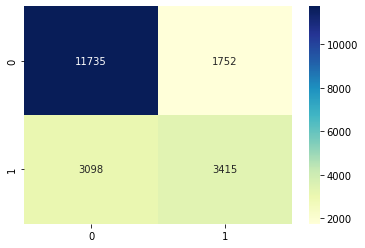

In [ ]:
stacking_clf = StackingClassifier(estimators=[('cat', cat_clf_def),('rnd', rnd_clf), ('lgbm', lgbm_clf), ('xgb', xgb_clf),  ('dtc', dtc_clf),  ('ada', ada_clf), ('gbc', gbc_clf), ('bag', bag_clf), ('ext', ext_clf), ('knn', knn_clf), ('lgbmstack', stacking_lgbm_clf)], final_estimator = LGBMClassifier())
stacking_clf.fit(X_train, y_train)
y_pred_stack = stacking_clf.predict(X_valid)

# ensemble(stacking) 성능 확인
get_clf_eval(y_valid, y_pred_stack)

In [ ]:
y_pred_prob = stacking_clf.predict_proba(X_valid)


정확도accuracy: 0.7472
정밀도precision: 0.6001
재현율recall: 0.6713
AUC: 0.7276
F1: 0.6337


{'AUC': 0.7276064646974936,
 'F1': 0.6336691064569895,
 '재현율recall': 0.6712728389375096,
 '정밀도precision': 0.6000548998078507,
 '정확도accuracy': 0.74725}

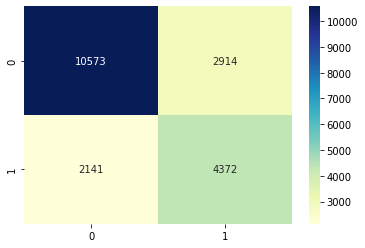

In [ ]:
get_clf_eval(y_valid, y_pred_prob[:,1]>0.4)

0.4

정확도accuracy: 0.7472
정밀도precision: 0.6001
재현율recall: 0.6713
AUC: 0.7276
F1: 0.6337
0.405

정확도accuracy: 0.7489
정밀도precision: 0.6035
재현율recall: 0.6670
AUC: 0.7277
F1: 0.6337
0.41

정확도accuracy: 0.7500
정밀도precision: 0.6065
재현율recall: 0.6614
AUC: 0.7271
F1: 0.6328
0.415

정확도accuracy: 0.7498
정밀도precision: 0.6080
재현율recall: 0.6522
AUC: 0.7246
F1: 0.6293
0.42

정확도accuracy: 0.7507
정밀도precision: 0.6109
재현율recall: 0.6458
AUC: 0.7236
F1: 0.6279
0.425

정확도accuracy: 0.7520
정밀도precision: 0.6143
재현율recall: 0.6409
AUC: 0.7233
F1: 0.6273
[(0.4, {'정확도accuracy': 0.74725, '정밀도precision': 0.6000548998078507, '재현율recall': 0.6712728389375096, 'AUC': 0.7276064646974936, 'F1': 0.6336691064569895}), (0.405, {'정확도accuracy': 0.74885, '정밀도precision': 0.603500972492359, '재현율recall': 0.6669737448180562, 'AUC': 0.7276812818403324, 'F1': 0.6336518124133907}), (0.41, {'정확도accuracy': 0.75, '정밀도precision': 0.6065042939602985, '재현율recall': 0.6614463380930447, 'AUC': 0.7271048699436825, 'F1': 0.6327849588719154}), (0.41

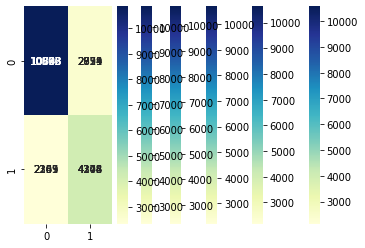

In [ ]:
t = []
for probnum in [x/1000 for x in range(300,450,10)]:
    print(probnum)
    r = get_clf_eval(y_valid, y_pred_prob[:,1]>probnum)
    t.append((probnum, r))

print(t)

# Submission

In [ ]:
# folder = '/content/drive/MyDrive/Colab Notebooks/ML study/day27 220126'

# 제출 양식 다운로드
submit = pd.read_csv(os.path.join(folder, 'sample_submission.csv'))

# prediction 수행
df_test = pd.read_csv(os.path.join(folder, 'test.csv'))
submit['answer'] = stacking_clf.predict(df_test.drop(columns=['ID']))

# 제출 파일 저장
submit.to_csv(os.path.join(folder, 'prediction.csv'), index=False)

In [ ]:
# folder = '/content/drive/MyDrive/Colab Notebooks/ML study/day27 220126'

# 제출 양식 다운로드
submit = pd.read_csv(os.path.join(folder, 'sample_submission.csv'))

# prediction 수행
df_test = pd.read_csv(os.path.join(folder, 'test.csv'))
submit['answer'] = stacking_clf.predict_proba(df_test.drop(columns=['ID']))[:,1]>0.4
submit["answer"] = submit["answer"].astype(int)

# 제출 파일 저장
submit.to_csv(os.path.join(folder, 'prediction.csv'), index=False)